# Leveraging WiFi Data to Gain Insight

University of New Hampshire ECE 824 Final Project

Authors: Colin Cambo, Austin Smith

<b>NOTE: THIS DOCUMENT IS AN INTERACTIVE  JUPYTER NOTEBOOK, IT CONTAINS ALL CODE NECESSARY TO BE ABLE TO REPRODUCE OUR RESULTS. THROUGHOUT THIS PAPER YOU WILL SEE CODE EXAMPLES FOR HOW EACH STEP WAS EXECUTED, AND AN EXPLANATION OF THE CODE IN ITALICS.</b><br>

For more information on Jupyter Notebooks please check <a href = 'http://jupyter.org/about.html'>here.</a>


## Notebook Contents

* [0 Introduction](#0)
  * [0.1 Requirements](#0.1)
* [1 Data](#1)
  * [1.1 UNH Wifi Data](#1.1)
  * [1.2 Company MAC Address Data](#1.2)
  * [1.3 Access Point Locations](#1.3)
  * [1.4 Unique Building Paths](#1.4)
  * [1.5 UNH Building Locations](#1.5)

* [2 Descriptive Statistics](#2)
  * [2.1 General Descriptive Statistics](#2.1)
  * [2.2 Top Paths](#2.2)
  * [2.3 Hourly Connections](#2.3)
  * [2.4 Geographic Plots](#2.4)

    * [2.4.1 Campus Heat Map](#2.4.1)
    * [2.4.2 Building Paths](#2.4.2)
    * [2.4.3 Iterative Building Paths](#2.4.3)
    
      * [2.4.3.1 Unfiltered](#2.4.3.1)
      * [2.4.3.2 Filtered](#2.4.3.2)

* [3 Interactive Descriptive Plots](#3)
  * [3.1 Interactive Top Path Comparison](#3.1)
  * [3.2 Interactive Hourly Connection Scatterplot](#3.2)
  * [3.3 Interactive Geographic Plotting](#3.3)
  
    * [3.3.1 Path Plot Tab](#3.3.1)
    * [3.3.2 Heat Map Tab](#3.3.2)
    * [3.3.3 Iterative Path Tab](#3.3.3)

* [4 Results](#4)

* [5 Discussion/Conclusion](#5)

# 0 Introduction
<a id = '0'></a>
<br>
## Project Overview

For our project we set out to answer the question "can WiFi data be leveraged into valuable insight for a university?" To answer this question we decided to develop tools for the University of New Hampshire that would turn their WiFi data into insights about traffic patterns and building usage. We anticipate that these tools could be applied in such a way that a school administrator could make many efficient decisions such as building utilization in order to save energy, optimal dining hall hours, and identifying  student rooms that are above their allowable capacity.

## Background

A [smart city](https://en.wikipedia.org/wiki/Smart_city) is defined as "an urban development vision to integrate multiple information and communication technology (ICT) and Internet of Things (IoT) solutions in a secure fashion to manage a city's assets." The movement towards creating smart cities and smart campuses has been a growing trend globally and an interesting context of research within the field of Ubiquitous Computing. The idea being that managing information systems and installing smart technology can help solve problems for areas which need improvements on college campuses or within a city. Some of these issues include:

  * "How can we create a safe environment for students?"
  * "Where are students spending the most time and how can access to those spaces be managed more effectively?"
  * "Where can more WiFi access points be added to improve internet access to students?"
  * "Where and when will students be most likely to see a mass advertising or important message from the university?"

The list of improvements university administrators would like to make is immense and the idea of smart campus technology is to use networked technology in the background to help streamline and improve the efficiency of the campus. 

The problem with the smart campus concept is that adding in these technologies and systems is complex and costly for the university. Especially given how much utility such systems may provide. Often times when looking at the cost benefit analysis of many of these technologies, while the results are impressive, the systems are not worth the cost. 

In response to this issue, we considered the idea that maybe our university, (University of New Hampshire) may be able to make use of the existing technology infrastructure to develop tools that can help to get an idea of how students travel around campus, and from this information the university can gain valuable insight. 

## 0.1 Requirements
<a id = '0.1'></a>
This entire notebook is runnable so you can easily follow along, but some packages might need to be installed.

If you have Python installed through Anaconda you will have all the necessary packages except [Basemap.](http://matplotlib.org/basemap/)

[Here](http://stackoverflow.com/questions/33020202/how-to-install-matplotlibs-basemap) is a link to how to install Basemap with pip.

If you can run the cell below without getting an error then you have all the packages necessary for this notebook.

In [1]:
import pandas as pd
from datetime import datetime
from collections import defaultdict, Counter
import matplotlib.pyplot as plt
import pandas as pd
from datetime import datetime
from collections import defaultdict, Counter
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.patches as mpatches
from ipywidgets import widgets
from IPython.display import display, clear_output
from ipywidgets import interact, interactive, fixed
from matplotlib import colors as colors_
from mpl_toolkits.basemap import Basemap

%matplotlib inline

#Makes it easy to convert numbers back to weekday names
WEEKDAY_DICT = {0:'Monday', 1:'Tuesday', 2:'Wednesday', 3:'Thursday', 4:'Friday', 5:'Saturday', 6:'Sunday'}

#Colors used for various plots
MY_COLORS = 'blue red green yellow purple black orange white teal crimson cyan brown gray hotpink lavendar'.split()

# 1 Data
<a id = '1'></a>

## 1.1 University of New Hampshire Wifi Data
<a id = '1.1'></a>

Through working with the University of New Hampshire Information Technology department, we were able to secure data for a weeks worth of historical data. This dataset contained data detailing every single connection to the university wireless network in that time frame. The following variables were included:

- __'MAC_Address'__: This is the unique MAC address of the device which made the connection to the network. Every wireless chip has a unique MAC address associated with it. [More information](https://en.wikipedia.org/wiki/MAC_address) about MAC Addresses.
- __'Time'__: This variable contained the date and time of connection in the following format, '2015-09-19 23:59:59'
- __'Access_Point'__: This variable contatained the unique identifier of the exact access point in which the connection was made
- __'Description'__: Finally, this variable shows the description of where the access point is in which the connection was made, for example, 'Gables Building C Room 605C' (We removed this one for anonymity)

__Randomizing Data__  
In order to keep this data secure and anonymous we decided to alter some of the data. We replaced the week's date we were given with a random week so that no one could find their own connections, we made sure to make the weekday's line up though so general insights can still be gathered. We also decided to replace the last 6 hex digits of everyone's MAC Addresses with an assigned number so that they don't represent people's actual MAC Addresses. We chose to assign a number between 0x000000 - 0xFFFFFF instead of hashing because hashing the last six digits grew the size of the string enormously and we believe this serves the same function of keeping the users MAC Addresses anonymous. The last thing we did to the data was remove the access point description's so now you'll only know when someone connects to a building not an individual access point. This helped us to save space and provides another layer of security so that it's very difficult to know what access point is in each room.

The data we were given was split up into 14 seperate csv's. For each day there was a csv for residential building connections and a csv for all other buildings.

*The code below reads in two sample datasets as pandas DataFrames and standardizes their 'Time' and 'MAC_Address' columns with converters*

In [2]:
#Converters for standardizing data being read in
convert_time = lambda x: x.replace('+00', '')
convert_mac = lambda x: x.replace(':', '').upper()

#Residential data
auth_df = pd.read_csv(r'./Data/WiFi_Data\randomized_auth_2015-09-19.csv',names=['MAC_Address', 'Time', 'Access_Point'], 
                 converters={'Time':convert_time, 'MAC_Address':convert_mac})
#Non-residential data
xt_auth_df = pd.read_csv(r'./Data/WiFi_Data\randomized_xt_auth_2015-09-19.csv',names=['MAC_Address', 'Time', 'Access_Point'], 
                 converters={'Time':convert_time, 'MAC_Address':convert_mac})

For illustrative purposes, the data shown below is the first ten rows of the data from both datasets.

In [3]:
print('This is the first ten rows of the residential data set!')
print(auth_df.head(10))
print('Length: ', len(auth_df))

This is the first ten rows of the residential data set!
    MAC_Address                 Time Access_Point
0  00199D000000  2015-09-19 23:59:59      GBCAP63
1  38CADA000001  2015-09-19 23:59:59       STAP86
2  DC415F000002  2015-09-19 23:59:59      WSMAP08
3  AC5F3E000003  2015-09-19 23:59:59      STAP113
4  4C6641000004  2015-09-19 23:59:59      SRBAP24
5  68DBCA000005  2015-09-19 23:59:59       NDAP07
6  38CADA000001  2015-09-19 23:59:59       STAP86
7  0056CD000006  2015-09-19 23:59:59       AXAP40
8  78D75F000007  2015-09-19 23:59:59       GSAP03
9  A08869000008  2015-09-19 23:59:59       MSAP76
Length:  511826


In [4]:
print('This is the first ten rows of the non-residenial data set!')
print(xt_auth_df.head(10))
print('Length: ', len(xt_auth_df))

This is the first ten rows of the non-residenial data set!
    MAC_Address                 Time Access_Point
0  F41BA1000739  2015-09-19 23:59:59      PCAP122
1  90B686003764  2015-09-19 23:59:59       NMAP08
2  D02598000F69  2015-09-19 23:59:59       MBAP06
3  544E900016E1  2015-09-19 23:59:59       NHAP19
4  BC6C2100049D  2015-09-19 23:59:59       PBAP04
5  7831C1002B90  2015-09-19 23:59:58       PKAP01
6  0056CD002F68  2015-09-19 23:59:58       PKAP04
7  2C0E3D000EFA  2015-09-19 23:59:58       PBAP04
8  6C72E7000811  2015-09-19 23:59:58       KBAP36
9  5055270039F8  2015-09-19 23:59:58       KBAP61
Length:  279656


We decided to merge the data into a single DataFrame and add some new columns to make it easier for us to use. Below is the code that merges the 14 files into a single DataFrame and adds three new columns. 

Three new colums as follows:
- __'Hours'__: This column is the hour of the connection time taken out of the main 'Time' column, this allows for a bit easier filtering by date/time
- __'Minutes'__:This column is the minute of the connection time taken out of the main 'Time' column, this allows for a bit easier filtering by date/time
- __'Weekday'__:This column is the day of the connection time (0-Monday, 6-Sunday) taken out of the main 'Time' column, this allows for a bit easier filtering by date/time.

 __NOTE:__ Running the code below will take awhile.

In [5]:
wifi_df = pd.DataFrame() # Initialize empty DataFrame
for i in range(19,26):
    
    auth_df = pd.read_csv(r'./Data/WiFi_Data/randomized_auth_2015-09-'+str(i)+'.csv', #File path
                          names=['MAC_Address', 'Time', 'Access_Point'], #Column names
                          converters={'Time':convert_time, 'MAC_Address':convert_mac}) #Converters
    
    xt_auth_df = pd.read_csv(r'./Data/WiFi_Data/randomized_xt_auth_2015-09-'+str(i)+'.csv', #File path
                             names=['MAC_Address', 'Time', 'Access_Point'], #Column Names
                             converters={'MAC_Address':convert_mac}) #Converters
    
    #Concatenating DataFrame's
    wifi_df = pd.concat([wifi_df, auth_df, xt_auth_df])   

    #Creating datetime columns
    datetimes = [(datetime.strptime(str(t), '%Y-%m-%d %H:%M:%S')) for t in wifi_df['Time'].tolist()]
    hours = [t.hour for t in datetimes]
    day_of_week = [t.weekday() for t in datetimes]
    minutes = [t.minute for t in datetimes]

    #Appending new time columns to DataFrame
    wifi_df['Hours'] = hours
    wifi_df['Weekday'] = day_of_week
    wifi_df['Minutes'] = minutes

The first five rows of data is shown below to get an idea of the format of the new columns.

In [6]:
wifi_df.head()

,Access_Point,Hours,MAC_Address,Minutes,Time,Weekday
0,GBCAP63,23,00199D000000,59,2015-09-19 23:59:59,5
1,STAP86,23,38CADA000001,59,2015-09-19 23:59:59,5
2,WSMAP08,23,DC415F000002,59,2015-09-19 23:59:59,5
3,STAP113,23,AC5F3E000003,59,2015-09-19 23:59:59,5
4,SRBAP24,23,4C6641000004,59,2015-09-19 23:59:59,5


## 1.2 Company MAC Address Data
<a id = '1.2'></a>
Since we were given MAC Addresses with our dataset we decided it would be beneficial to match up each MAC Address with the corresponding company it belongs to so that we can better guess what the device happens to be. We were able to locate a nicely formatted csv of MAC Addresses and their company from the following github account (https://github.com/TakahikoKawasaki/nv-oui/blob/master/data/oui.csv). With this new file we decided to append the MAC Address Company.

- __'MAC_Company'__: The fist six digits of a MAC Address indicates the name of the manufacturer of the device. We added this column to help us distinguish what sorts of devices we have on the network and to allow us to exclude irrelevent MAC addresses.

In [7]:
df = pd.read_csv(r'./Data/oui.csv')#Reading in MAC Address Company csv as DataFrame
oui_dict = {i:df.ix[c,2] for c, i in enumerate(df.ix[:,1].values)}#Converting DataFrame above to dictionary for O(1) lookup time

def find_device(mac):
    """
    Returns company registered to MAC Address
    
    Keyword Argument:
    mac -- MAC Address Prefix (6 Digit Hexadecimal string)
    """
    try:
        return oui_dict[mac]
    except:
        return 'UNKNOWN'

*The code below runs the find_device function for every MAC Address in our dataset and attaches the companies to our dataset.*

In [8]:
wifi_df['MAC_Company'] = [find_device(str(r)[:6]) for r in wifi_df['MAC_Address'].tolist()]

Below is the first five rows of the data with the new column added to it.

In [9]:
wifi_df.head()

,Access_Point,Hours,MAC_Address,Minutes,Time,Weekday,MAC_Company
0,GBCAP63,23,00199D000000,59,2015-09-19 23:59:59,5,"VIZIO, Inc."
1,STAP86,23,38CADA000001,59,2015-09-19 23:59:59,5,"Apple, Inc."
2,WSMAP08,23,DC415F000002,59,2015-09-19 23:59:59,5,"Apple, Inc."
3,STAP113,23,AC5F3E000003,59,2015-09-19 23:59:59,5,SAMSUNG ELECTRO-MECHANICS(THAILAND)
4,SRBAP24,23,4C6641000004,59,2015-09-19 23:59:59,5,UNKNOWN


As we can see from the first 5 entries we have many different companies. To get a better idea of the distribution of devices we decided to count the number of times each company appeared in the dataset.

*Below we're removing all duplicate MAC_Address rows, then counting the number of times each company shows up, and saving the top 10 as tuples to a list.*

In [10]:
unique_mac_cnt = Counter(wifi_df.drop_duplicates(['MAC_Address'])['MAC_Company'].tolist())#Counts # of unique company addresses
top_10_companies = sorted(list(unique_mac_cnt.items()), key= lambda x: x[1], reverse=True)[:10]#Converts top ten to list

Plotting a simple bar graph of the top ten companies on campus according to unique MAC Addresses will help us to understand the device distribution.

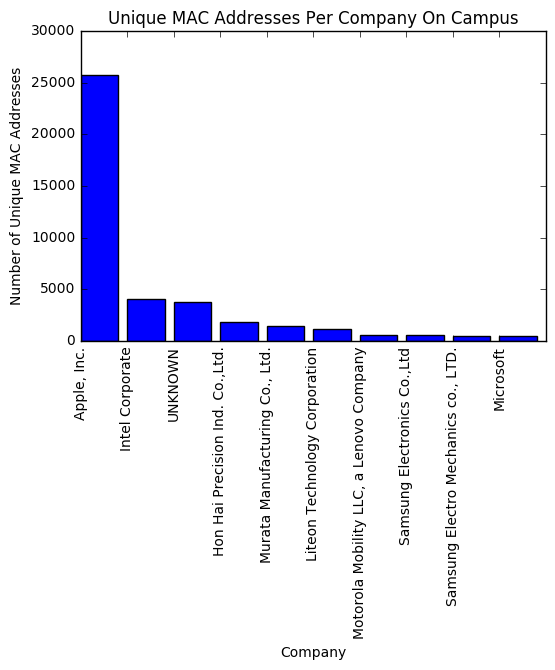

In [11]:
plt.bar(range(10), [x[1] for x in top_10_companies])
plt.xticks(range(10), [x[0] for x in top_10_companies], rotation=90)
plt.xlim([0,10])
plt.title('Unique MAC Addresses Per Company On Campus')
plt.ylabel('Number of Unique MAC Addresses')
plt.xlabel('Company')

As you can see from the bar graph, Apple comprises 25,000+ unique devices while the next largest company had around 4,000. Upon discovering this, we made the decision to focus solely on Apple devices as they are more likely to be portable devices such as phones or laptops. While there may be some other devices like Apple TV's and desktop computers, we felt as though focusing solely on apple devices was the best way to capture students movements without too much noise from network devices which were likely not traveling with students.

*The code below filters the DataFrame for only rows that have 'MAC_Company' equal to 'Apple, Inc.'*

In [12]:
#Selecting only Apple Devices, sorting by time, and then resetting the index of the rows
wifi_df = wifi_df[wifi_df['MAC_Company']=='Apple, Inc.'].sort_values(by=['Time']).reset_index(drop=True)

## 1.3 Access Point Locations
<a id = '1.3'></a>

Without the location of each connection focusing on iPhones would be useless, thankfully the University of New Hampshire IT department provided us with the csv "Access_Locations.csv" which contains the access point number and the building that access point happens to be in. In order for us to work with the data more easily we decided to append a column to our dataset that consists of which building each connection takes place in. 

*The code below reads in the "Access_Locations.csv" dataset as a DataFrame then iterates through the DataFrame adding the access points and their corresponding building to a dictionary.The dictionary is then used to generate a new column "Building" from every row in the original wifi_df dataset.*

In [13]:
aploc = pd.read_csv(r'./Data/Access_Locations.csv', header=0)
building_dict = defaultdict(lambda: 'Unknown')
for row in aploc.iterrows():
    building_dict[row[1]['access_point']] = row[1]['building']
    
buildings_add = [building_dict[key] for key in wifi_df['Access_Point'].tolist()]
wifi_df['Building'] = buildings_add
wifi_df = wifi_df[wifi_df['Building']!='Unknown'].reset_index(drop=True)

We noticed that when tracking an individual user, we would get a dataset showing the following below:

In [14]:
mac_track_df = wifi_df[wifi_df.MAC_Address=='38CADA000001'].reset_index(drop=True)
mac_track_df.head(10)

,Access_Point,Hours,MAC_Address,Minutes,Time,Weekday,MAC_Company,Building
0,BTAP12,18,38CADA000001,26,2015-09-19 18:26:36,5,"Apple, Inc.",Barton
1,CTAP01,18,38CADA000001,32,2015-09-19 18:32:37,5,"Apple, Inc.",Craft
2,STAP78,20,38CADA000001,18,2015-09-19 20:18:20,5,"Apple, Inc.",Stoke
3,STAP78,20,38CADA000001,23,2015-09-19 20:23:56,5,"Apple, Inc.",Stoke
4,SCAP02,22,38CADA000001,30,2015-09-19 22:30:29,5,"Apple, Inc.",Scott
5,JDAP09,22,38CADA000001,32,2015-09-19 22:32:36,5,"Apple, Inc.",Jessie Doe
6,JDAP16,22,38CADA000001,33,2015-09-19 22:33:59,5,"Apple, Inc.",Jessie Doe
7,JDAP16,22,38CADA000001,34,2015-09-19 22:34:06,5,"Apple, Inc.",Jessie Doe
8,JDAP16,22,38CADA000001,34,2015-09-19 22:34:06,5,"Apple, Inc.",Jessie Doe
9,JDAP16,22,38CADA000001,34,2015-09-19 22:34:51,5,"Apple, Inc.",Jessie Doe


This shows us that a majority of connections are just from someone switching access points in the same building, which doesn't give us very much information on their movements on a macro level.

## 1.4 Unique Building Paths
<a id = '1.4'></a>

To solve the problem of repeating building rows, we chose to eliminate the movements within a building, since we are mostly concerned with how students are traveling around campus. We eliminated the inter-building movements by only keeping the first connection in each building.

*To calculate unique paths we created a new column called "Check" that would be a 1 when the corresponding MAC Address entered a new building, and a 0 when he moved around in the same building. To accomplish this we initialized check to 1 at every first occurence of a MAC Address and recorded what building each MAC Address started in with a dictionary. From there we cycled through the sorted DataFrame and compare the "Building" value in every row with what our dictionary had as it's value for the MAC Address key. If the values were the same then mark the row's "Check" column with a 0, and if the values didn't match then replace the dictionary value with the new building and set the "Check" column to 1. After cycling through the DataFrame we filtered out all rows with a "Check" value of 0 and then deleted the "Check" column and reset our DataFrame's index.*

*After removing all rows that were of no use to us we created another column "Time_Since_Last_Connect" that would represent the time between buildings in minutes by subtracting the time values between every MAC Address's connections.*

In [15]:
wifi_df = wifi_df.dropna().reset_index(drop=True)

unique_checker = [0]*len(wifi_df) # list of zeros used to check if connection unique

mac_dict = defaultdict(lambda: 'None')

for i, (building, user) in enumerate(zip(wifi_df['Building'].tolist(), wifi_df['MAC_Address'].tolist())):
    if mac_dict[user]=='None':
        mac_dict[user] = building
        unique_checker[i] = 1
    elif mac_dict[user]!=building:
        unique_checker[i] = 1
        mac_dict[user] = building

wifi_df['Check'] = unique_checker
#wifi_df = wifi_df[(wifi_df.Check==1) & (wifi_df.Building!='0')].reset_index(drop=True)
wifi_df = wifi_df[wifi_df.Check==1].reset_index(drop=True)
wifi_df = wifi_df.drop('Check', 1)

last_time_dict = {}
last_time_list = [0]*len(wifi_df)

for i, (time, mac) in enumerate(zip(wifi_df['Time'].tolist(), wifi_df['MAC_Address'].tolist())):
    if mac not in last_time_dict:
        last_time_list[i] = 0
        last_time_dict[mac] = time
    else:
        last_time_list[i] = int((datetime.strptime(time,
                                    '%Y-%m-%d %H:%M:%S') - datetime.strptime(last_time_dict[mac],
                                                                            '%Y-%m-%d %H:%M:%S')).total_seconds()/60)
        last_time_dict[mac] = time
wifi_df['Time_Since_Last_Connect'] = last_time_list

In [16]:
mac_track_df = wifi_df[wifi_df.MAC_Address=='38CADA000001'].reset_index(drop=True)

The section of data shown below illustrates what the dataset looks like after focusing only on unique connections. We removed the non-informative data points and added a variable called 'Time_Since_Last_Connect' which is the time in minutes since the MAC Address connected to their last building. This allows us to have an idea of how many hours elapsed between connections from one building to the next.

In [17]:
mac_track_df.head()

,Access_Point,Hours,MAC_Address,Minutes,Time,Weekday,MAC_Company,Building,Time_Since_Last_Connect
0,BTAP12,18,38CADA000001,26,2015-09-19 18:26:36,5,"Apple, Inc.",Barton,0
1,CTAP01,18,38CADA000001,32,2015-09-19 18:32:37,5,"Apple, Inc.",Craft,6
2,STAP78,20,38CADA000001,18,2015-09-19 20:18:20,5,"Apple, Inc.",Stoke,105
3,SCAP02,22,38CADA000001,30,2015-09-19 22:30:29,5,"Apple, Inc.",Scott,132
4,JDAP09,22,38CADA000001,32,2015-09-19 22:32:36,5,"Apple, Inc.",Jessie Doe,2


## 1.5 UNH Building Locations

In order to be able to plot the buildings and use them in visualizations, we needed to create a table containing coordinates in latitude an longitude. We used satelite imagery of the campus and a map to manually create this table. The first five rows of which are shown below.

In [18]:
unh_buildings = pd.read_csv(r'./Data/Building_Locations.csv')

In [19]:
unh_buildings.head()

,building_names,latitude,longitude
0,Adams Tower,43.139059,-70.930673
1,Alexander,43.133578,-70.927602
2,Babcock,43.132371,-70.932693
3,Barton,43.141827,-70.938894
4,Christensen,43.131115,-70.934508


In [20]:
list_buildings = unh_buildings['building_names'].tolist()

We decided that appending two more columns to our dataset (latitude, longitude) would be memory intensive so we opted to creating a dictionary with the building name as the key and a tuple of the building's coordinates as the value. This allows us to very quickly look up building coordinates when we need them.

In [21]:
#Dictionary with building as key and a tuple of latitude and longitude as value
BUILDING_COORDS = {row[1][0]:(row[1][1], row[1][2]) for row in unh_buildings.iterrows()}

# 2 Descriptive Statistics
<a id = '2'></a>

The next step to our analysis was to run some descriptive statisticst in order to get a better understanding of the data. 

## 2.1 General Descriptive Statistics
<a id = '2.1'></a>
After cleaning the data, we ended up with 1,016,998 connections over the course of the week.

In [22]:
len(wifi_df)

1016998

Next we looked at what the top ten most frequently connected to access points on campus were. As shown below, we have the most commonly accessed access points on campus. The list below shows the top ten access points in order of most connections.

In [23]:
most_connected_ap = sorted(list(Counter(wifi_df['Access_Point'].tolist()).items()), key= lambda x:x[1], reverse=True)[:10]
for ap in most_connected_ap:
    print('Access Point: {} Building: {} Connections: {}'.format(ap[0], building_dict[ap[0]], ap[1]))

Access Point: MKAP33 Building: Murkland Connections: 19106
Access Point: HCAP29 Building: Holloway Commons Connections: 14032
Access Point: ETAP28 Building: Engelhardt Connections: 10845
Access Point: PKAP04 Building: Philbrook Connections: 10822
Access Point: CTAP01 Building: Craft Connections: 7803
Access Point: PKAP05 Building: Philbrook Connections: 7014
Access Point: HCAP12 Building: Holloway Commons Connections: 6127
Access Point: HSAP03 Building: Smith Connections: 5986
Access Point: GSAP39 Building: Gibbs Connections: 5699
Access Point: NHAP22 Building: New Hampshire Connections: 5667


## 2.2 Top Paths
<a id = '2.2'></a>
After performing some basic descriptive statistics, we started to visualize paths and devise a way to see what buildings students were traveling to from a given building. Plotting the top paths from a building can be very informative for understanding how students move throughout campus, so we thought it would be a good idea to create a function to do this.

Before we could create a function that could graph the paths of students we first needed to create another function that would return the paths. The function below will return a nested dictionary of all the building paths and the number of people who took the path within the specified times/days.

In [24]:
def get_paths(days, hour_range):
    """
    Returns nested dictionary of all building paths and # of people who took path for specified day and hour.
    
    Keyword arguments:
    day -- day of the week (list(int))
    hour_range -- tuple of start and end hours (int 0-23, int 0-23)  
    """
    hours = list(range(hour_range[0],hour_range[1]+1))#Converting our range to a list
    my_paths = wifi_df[(wifi_df.Weekday.isin(days)) & (wifi_df.Hours.isin(hours))]#Creating subset for given days/hours
    paths = {(b,c):0 for b in list_buildings for c in list_buildings if b!=c}#Dictionary of paths: key-(start,end), value-# ppl
           
    mac_add = {x:'0' for x in my_paths['MAC_Address'].tolist()}
    
    #Loop over all MAC Addresses and corresponding buildings in subset
    for (_building, mac) in zip(my_paths['Building'].tolist(), my_paths['MAC_Address'].tolist()):
        if mac_add[mac] == '0':#if first time 'mac' has shown up in for loop
            mac_add[mac] = _building#Set 'mac' key equal to _building
        elif mac_add[mac] == _building:#if 'mac' already equals _building, then pass
            pass
        else:#'mac' has moved buildings
            try:
                paths[(mac_add[mac], _building)] += 1#Add 1 to the paths dict for tuple (mac_add[mac], _building)
            except KeyError:
                pass
            mac_add[mac] = _building#Set mac_add[mac] current value to _building
      
    return paths

To get an idea of what this function is returning uncomment the line below and run the cell.

In [26]:
#get_paths([0], (12,16))

Now that we created a function that returns all paths we can finally graph the top 10 paths from a building. The function below will acually plot a bar graph of the top 10 paths from the building specified for the time/day specified.

In [27]:
def plot_top_paths(building, days, hour_range, percent=False):
    """
    Plots bar graph top 10 destinations from specified buildings at the specified time/day.
    
    Keyword Arguments:
    building -- name of building (string)
    days -- list of days interested in
    hour_range -- tuple of start and end hours
    percent -- Displays percentage on y-axis if True, raw count if false (boolean)
    """
    paths = {building:dict()}#Nested dictionary to keep track of paths
    
    #Adding every path whose first tuple element is 'building' to 'paths' dict
    paths[building] = {key[1]:value for key, value in get_paths(days, hour_range).items() if key[0] == building}
    total = sum([x[1] for x in paths[building].items()])#Getting the sum of all paths
    top_paths = sorted(list(paths[building].items()), key= lambda x:x[1], reverse=True)[:10]#Sorting paths & subsetting top 10
    plot_x, plot_y = [], []
    
    #Calculating percentages for top 10 paths
    for path in top_paths:
        if percent==True:
            plot_y.append(round((path[1]/total),2)*100)
        else:
            plot_y.append(path[1])
        plot_x.append(path[0])
    
    #Plotting bar graph of top 10 subset
    ax = plt.bar(range(10), plot_y, align='center')
    plt.xticks(range(10), plot_x, rotation=90)
    plt.xlim([0,10])
    plt.xlabel('Buildings Travelled to')
    if percent==True:
        plt.ylabel('Percent of Connections')    
    else:
        plt.ylabel('Number of Connections')
    plt.title('Top Paths From '+ str(building)+ ' On '+', '.join([(WEEKDAY_DICT[b]) for b in days])+' For Hours '+
              str(hour_range[0]) +' to '+str(hour_range[1]))
    
    return ax

The histogram below is from the function "plot_top_paths" we created above and has the following parameters:
   * __Building:__ 'Kingsbury'
   * __Day:__ 5 (Satuday)
   * __Time Range:__ 0 to 12 (1 AM to 1 PM)
   
This histogram shows the next building that students who were in Kingsbury Hall on Saturday from 1 AM to 1 PM were travelling to.

<Container object of 10 artists>

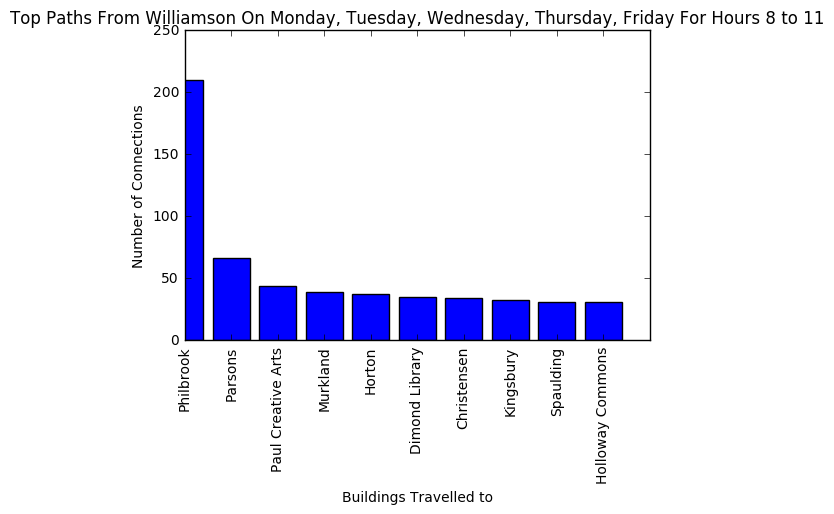

In [29]:
plot_top_paths('Williamson', [0, 1, 2, 3, 4], (8,11), percent=False)

The bar graph y-axis can be changed between a raw count and percentage by setting the optional parameter 'percent' to either True or False. By default this parameter is false, but for this example we set it to true.

This graph could provide the University insight into where the first place students are going to in the morning. As we can see in the graph above only around 25% of students leave Williamson between the hours of 8AM to 11AM on weekdays, to go to the closest dining hall (Philbrook). This raises some more interesting questions such as: 
  * Are most students skipping breakfast to sleep longer before their first class?
  * Do students not like breakfast at Philbrook? Why?
  * Are kids having a hard time sleeping in their dorms?

This graph alone doesn't tell the full story, but it is definitely capable of generating questions that might be able to answered from other graphs.

## 2.3 Hourly Connections
<a id = '2.3'></a>
The top path plot is great for finding out where people are going from a location, but it doesn't tell us anything about people coming in to a building. To deal with number of connections coming into a building we decided to create an easy function to show the amount of unique connections within a building over the course of the day. 

Below is a function that graphs a scatterplot of the connections over the course of the day. Because this function returns a matplotlib.pyplot.scatter we can easily call the function multiple times and stack their results for an easy comparison between buildings or days.


In [30]:
def plot_connections(building, day, color='Black'):
    """
    Plots scatter plot of unique building connections over specified day.
    
    Keyword arguments:
    building -- name of building (string)
    day -- day of the week (int)
    color -- color of points on graph, default Black
    """
    df = wifi_df[(wifi_df['Building'].str.contains(building)==True) & (wifi_df['Weekday']==day)]
    c = Counter(df['Hours'].tolist())
    ax = plt.scatter(range(len(c)), list(c.values()), color=color)
    plt.xlim([0, 23])
    plt.xlabel('Hour of Day')
    plt.ylabel('Number of Unique Connections')
    plt.title('Connections For '+ str(building))
    return ax

With this simple function we are able gather tons of information and we can answer simple questions such as:
  * What weekday is the busiest for a building?
  * What are the peak hours for the dining halls?
  * What building has the most students on weekends?
  * What dining hall is the busiest for dinner on weekdays?
  
I demonstrate the utility of this function by answering the bottom question "What dining hall is the busiest for dinner on weekdays?"

Below is three scatterplots created with this function, the first one's parameters are:
   * __Building:__ 'Philbrook'
   * __Day:__ 0 (Monday)
   * __Color:__ 'Blue'
   
The second one's parameters are:
   * __Building:__ 'Holloway Commons'
   * __Day:__ 0 (Monday)
   * __Color:__ 'Red'

The third one's parameters are:
   * __Building:__ 'Stillings'
   * __Day:__ 0 (Monday)
   * __Color:__ 'Green'
   
From the graph below we can see that Holloway Commons is significantly more busy than Philbrook and Stillings on weekdays, at least until 8PM, then Philbrook starts to become busier than Holloway Commons.

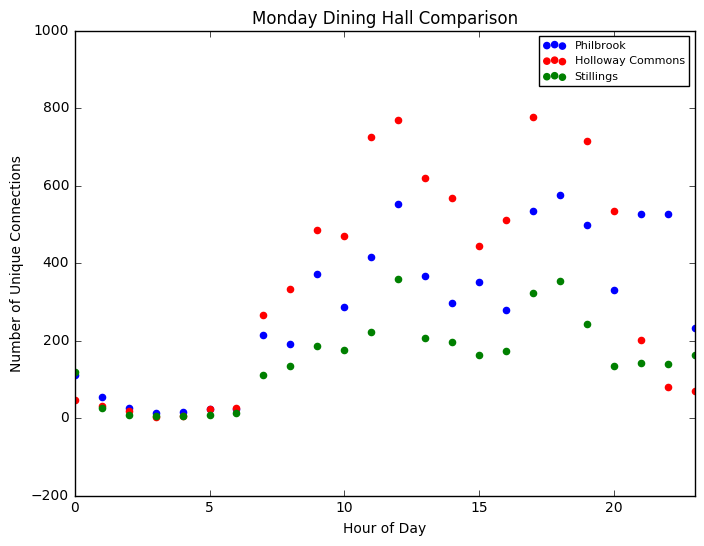

In [31]:
plt.figure(figsize=(8,6))
c = plot_connections('Philbrook', 0, 'Blue')
d = plot_connections('Holloway Commons', 0, 'Red')
e = plot_connections('Stillings', 0, 'Green')

plt.legend([c, d, e], ['Philbrook', 'Holloway Commons', 'Stillings'], loc='best', prop={'size':8})
plt.title('Monday Dining Hall Comparison')
plt.show()

## 2.4 Geographic Plots
<a id = '2.4'></a>
From the onset of this project, we realized that much of this data would be most interesting to see in the form of a geographical visualization. This turned out to be more difficult than we anticipated because the coordinates we gathered for every building happen to be slightly off from the ArcGIS image. This is due to the way ArcGIS and Google use different map projections that will differ on a micro level. You can read more about this issue [here.](http://support.esri.com/technical-article/000009982) To correct for this issue we added a x and y offset to every point.

Before we could plot any points we needed to get a map of the campus. Below is a function that we created that plots a high resolution image of the UNH campus, utilizing matplotlib's basemap and ArcGIS Server, and returns the Basemap object. Returning this basemap object is key to plotting lines and points on the map, because this object is able to convert coordinates into X and Y coordinates for matplotlib.

In [32]:
def plot_arcgis_campus():
    plt.figure(figsize=(12,16))
    
    m=Basemap(projection='merc', #Projection type
              llcrnrlon=-70.931135416, #Lower-left corner longtitude
              llcrnrlat=43.1341063997, #Lower-left corner latitude
              urcrnrlon=-70.9164369106, #Upper-right corner longitude
              urcrnrlat=43.149489287, #Upper-right corner latitude
              resolution='l', #Resolution type ('low')
              epsg=4236) #EPSG code defining projection
    
    m.drawmapboundary(fill_color='#F5F5F5', linewidth=0)
    m.arcgisimage(service='World_Street_Map', xpixels=1000, verbose= False)# Reads in ArcGIS image from server

    return m

The code below runs the function that plots the campus map. This shows what the map will look like before any manipulation is done.

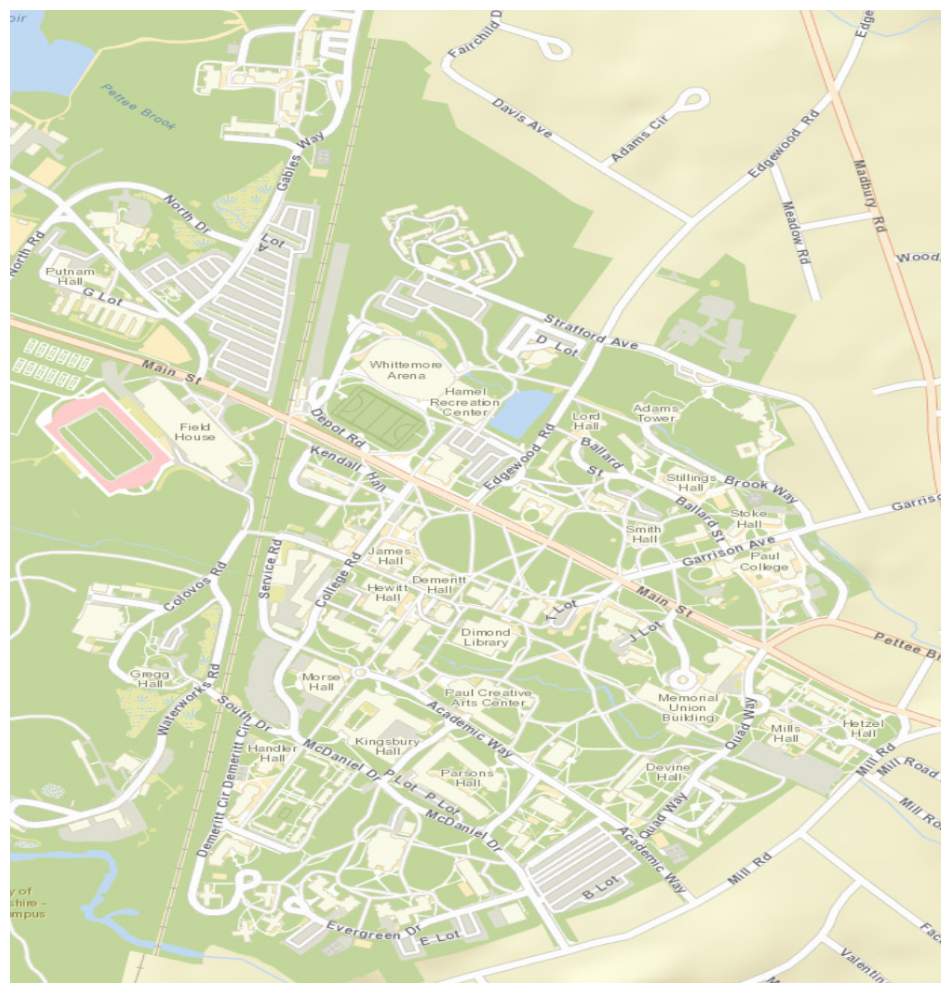

In [33]:
plot_arcgis_campus()

With this map we were able to create some very interesting visualizations that helped us to visualize what is going on around campus.

### 2.4.1 Campus Heat Map
<a id = '2.4.1'></a>
For our first vizualization, we created a Heat map of the campus where each building is plotted as a dot, and the size of each dot varies based on the number of unique connections in the building in the specified days/hours. We thought that from this map we could compare more buildings at once than was possible with our other functions.

Before we could plot a heat map of connections in every building though, we first needed a function to return all the connections within the specified days/hours. The function below will return a dictionary of the number of unique connections in every building.

In [34]:
def return_all_connections(days, hours):
    """
    Returns dictionary with buildings as keys and # of unique connections in building at specified time/day as values
    
    Keyword arguments:
    days -- days of the week (list(int))
    hours -- hours of each day (list(int))
    """
    my_data = wifi_df[(wifi_df.Weekday.isin(days)) & (wifi_df.Hours.isin(hours))]
    building_count = Counter(my_data['Building'].tolist())
    return dict(building_count.items())

To get a better understanding of what this function is doing uncomment the code in the cell below and then run it.

In [68]:
#return_all_connections([0, 1, 2, 3, 4], [0, 1])

Now that we got a dictionary of all of the unique connections in every building, we decided that we needed to create a function that would plot the different points we have on a map. The function below takes in a basemap object, a dictionary of points, and then plots the points on the basemap object.

In [37]:
def plot_points(m, point_dict, labels=True):
    
    x_offset = 0.0095
    y_offset = 0.004
    
    for key, value in point_dict.items():
        try:
            x, y = m(BUILDING_COORDS[key][1]+x_offset, BUILDING_COORDS[key][0]+y_offset)
            if labels == True:
                plt.text(x, y, str(value['value']), color='Black')
            m.plot(x, y, 'o', markersize=value['size'], color=value['color'], alpha=0.3)
        except KeyError:
            pass

__NOTE:__ The point_dict dictionary must be in the following format: 

    {(str):{'value':(int), 'size':(float), 'color':(color)}}
Where (str) must be a valid building name, (int) is the number of connections, (float) is the size of the point, and (color) is the color you want the point to be.

Example: {'Philbrook':{'value':200, 'size':20, 'color':'Blue'}}

For clarification on the format required for the "plot_points" function, the code below plots two points with the following values:
  * __'Philbrook'__: 'value':200, 'size':20, 'color':'Blue' 
  * __'Stoke'__: 'value':400, 'size':30, 'color':'Red'
  
Just uncomment the code in the cell below and then run the cell to see two points plotted.

In [66]:
#m = plot_arcgis_campus()
#plot_points(m, {'Hewitt':{'value':200, 'size':20, 'color':'Blue'}, 'Stoke':{'value':400, 'size':30, 'color':'Red'}})

After getting the function above working we were able to create a function to plot a heat map of the campus. Below is the code for the function "campus_heatmap" which plots a heat map of the campus on the specified days at the specified hour_range.

In [64]:
def campus_heatmap(days, hour_range):
    """
    Plots paths from specified buildings on specified time/day
    
    Keyword arguments:
    days -- days of the week (list of integers from 0-6)
    hour_range -- tuple of integers (start hour, end hour)
    """
    hours = list(range(hour_range[0],hour_range[1]+1))
    heat_dict = return_all_connections(days, hours)
    
    total = sum(heat_dict.values())
    dot_scale = 40/(max(heat_dict.values())/total)#Sets biggest dot to size 40
    
    point_dict = {key:{'value':value, 'size':dot_scale*(value/total), 'color':'Blue'} for key, value in heat_dict.items()}
    
    m = plot_arcgis_campus()
    plot_points(m, point_dict)
    
    plt.title('Heat Map Connections For Days {} For Time Range {} to {}'.format(', '.join([(WEEKDAY_DICT[day]) for day in days]),
                                                                                  *hour_range))

This function allows us to compare all buildings very quickly and can be used to answer many questions such as:
  * What academic buildings have the most traffic on Saturdays?
  * What dorms have the most people entering between 12AM and 2AM on weekdays?
  
To demonstrate just how these questions can be answered i'll answer the last question.

To answer this question I use the following parameters:
  * __days:__  [0, 1, 2, 3, 4] (Monday-Friday)
  * __hour_range:__ (0,2) 12AM to 2AM
  
This map is very useful because you can quickly compare activity between buildings at the specified times/days. From this graph we can see that 'Holloway Commons' has the most unique connections between noon and 4 PM (2,914) total connections).

Woodman


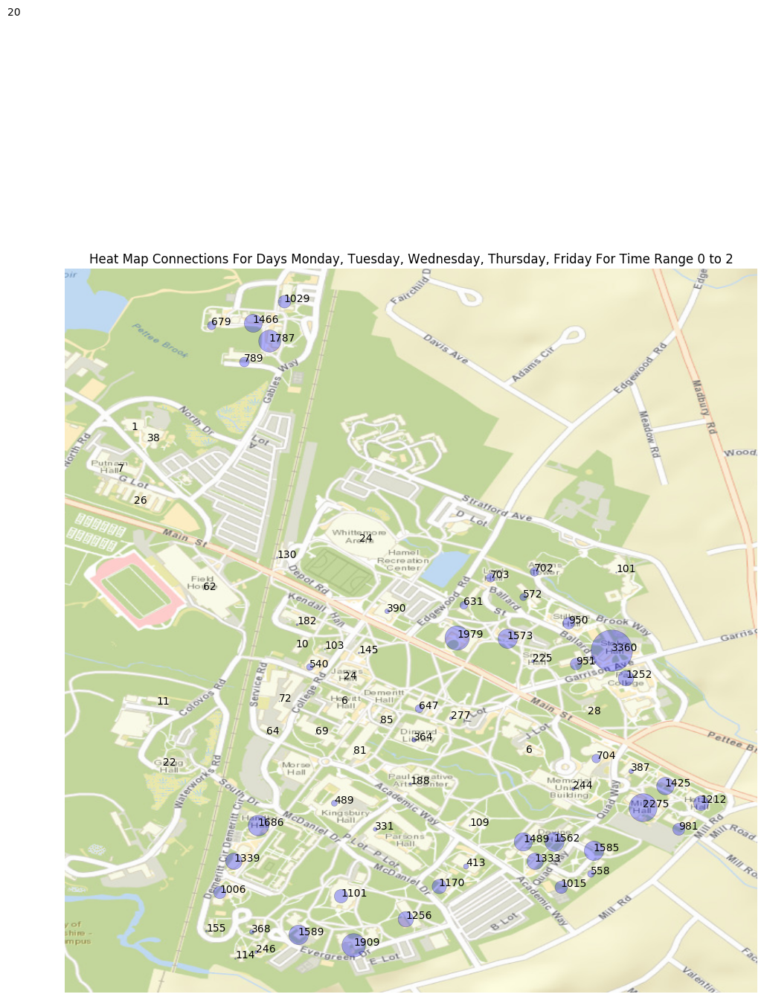

In [65]:
campus_heatmap([0, 1, 2, 3, 4], (0,2))

As you can see from the above heat map it is clear that Stoke is the dorm with the most late night connections. This is probably due to Stoke having a higher number of kids living there, but this could easily be checked by dividing every dorm by their number of residents before plotting.

### 2.4.2 Building Paths
<a id = '2.4.2'></a>
The heat map gave us a very clear illustration about where people are connecting to, but it told us nothing about where their connecting from. To get a better idea of how people move on campus we thought to create a function that plotted where students were travelling to.

Before we could plot where students are travelling to though we first needed a function to plot lines. The function below actually takes in a basemap object, a dictionary of lines, and then plots the lines on the basemap. 

In [43]:
def plot_lines(m, line_dict, labels=False):
    
    x_offset = 0.0095
    y_offset = 0.004
    
    for key, value in line_dict.items():
        try:
            lonlist = [BUILDING_COORDS[key[0]][1]+x_offset, BUILDING_COORDS[key[1]][1]+x_offset]
            latlist = [BUILDING_COORDS[key[0]][0]+y_offset, BUILDING_COORDS[key[1]][0]+y_offset]
            x, y = m(lonlist, latlist)
            if labels == True:
                text_lon = (BUILDING_COORDS[key[0]][1]+x_offset) + (BUILDING_COORDS[key[1]][1]+x_offset)
                text_lat = (BUILDING_COORDS[key[0]][0]+y_offset) + (BUILDING_COORDS[key[1]][0]+y_offset)
                x_text, y_text = m(text_lon, text_lat)
                plt.text(x_text/2, y_text/2, str(value['value']), color=value['color'], alpha=value['alpha'], weight='bold')
            m.plot( x, y, color=value['color'], lw=value['lw'], alpha=value['alpha'])
        except KeyError:
            pass

__NOTE:__ The line_dict dictionary must be in the following format: 

    {((str), (str)):{'value':(int), 'lw':(float), 'alpha':(float), 'color':(color)}}
Where ((str), (str)) is a tuple of building names, 'value':(int) is the number of connections, 'lw':(float) is the line width, 'alpha':(float) is the line's alpha value, and 'color':(color) is the color you want the line to be.

Example: {('Philbrook', 'Kingsbury'):{'value':200, 'lw':5, 'color':'Blue', 'alpha':.5}}

Uncomment the code below to see what a line looks like on the map.

In [67]:
#m = plot_arcgis_campus()
#plot_lines(m, {('Philbrook', 'Kingsbury'):{'value':200, 'lw':5, 'color':'Blue', 'alpha':.5}})

In [45]:
def plot_path_lines(days, hour_range, buildings):
    """
    Plots paths from specified buildings on specified time/day
    
    Keyword arguments:
    days -- days of the week (list of integers from 0-6)
    hour_range -- tuple of integers (start hour, end hour)
    building -- list of buildings interested in plotting path lines for (list of strings)
    """
    path_dict = {key:value for key, value in get_paths(days, hour_range).items() if key[0] in buildings}
    
    if len(buildings)>15:
        print("Too many buildings selected! Can only plot 15")
        return
   
    #Scaling metrics used for lines and alpha values
    total = sum(path_dict.values())
    building_max = max(path_dict.values())
    alpha_scale = 1/building_max
    lw_scale = 8/building_max
    
    #Converting values into proper format for 'plot_lines' function
    color_dict = {building:color for building, color in zip(buildings, MY_COLORS)}
    line_dict = {key:{'value':value, 'lw':lw_scale*value, 'alpha':alpha_scale*value, 'color':color_dict[key[0]]} for key,
                 value in path_dict.items()}
    
    #Plotting the points and lines
    m = plot_arcgis_campus()
    plot_points(m, {building:{'value':0, 'size':5, 'color':'#444444'} for building in list_buildings}, labels=False)
    plot_lines(m, line_dict, labels=True)
    
    #Title of graph
    plt.title('Connections From '+str(', '.join(buildings)) + ' For Days '+ ', '.join([(WEEKDAY_DICT[day]) for day in days]) \
              + ' For Time Range ' + str(hour_range[0]) + ' to ' + str(hour_range[1]))
    #Legend of graph
    plt.legend(handles=[mpatches.Patch(color=color_dict[building], label=building) for building in buildings])

This function allows us to see where people are going from multiple buildings, allowing us to answer some questions like:
  * Are students eating at local dining halls, or are they travelling to other dining halls?
  * Are students who live in dorms at the ends of campus travelling far to get to class?
  
To demonstrate this function's capability I will answer the first question with an example.
The parameters used were:
  * __days:__  [0, 1, 2, 3, 4] (Monday-Friday)
  * __hour_range:__ (7,11) 7AM to 11AM
  * __buildings:__ ['Philbrook', 'Stillings', 'Holloway Commons']
  <br>
  

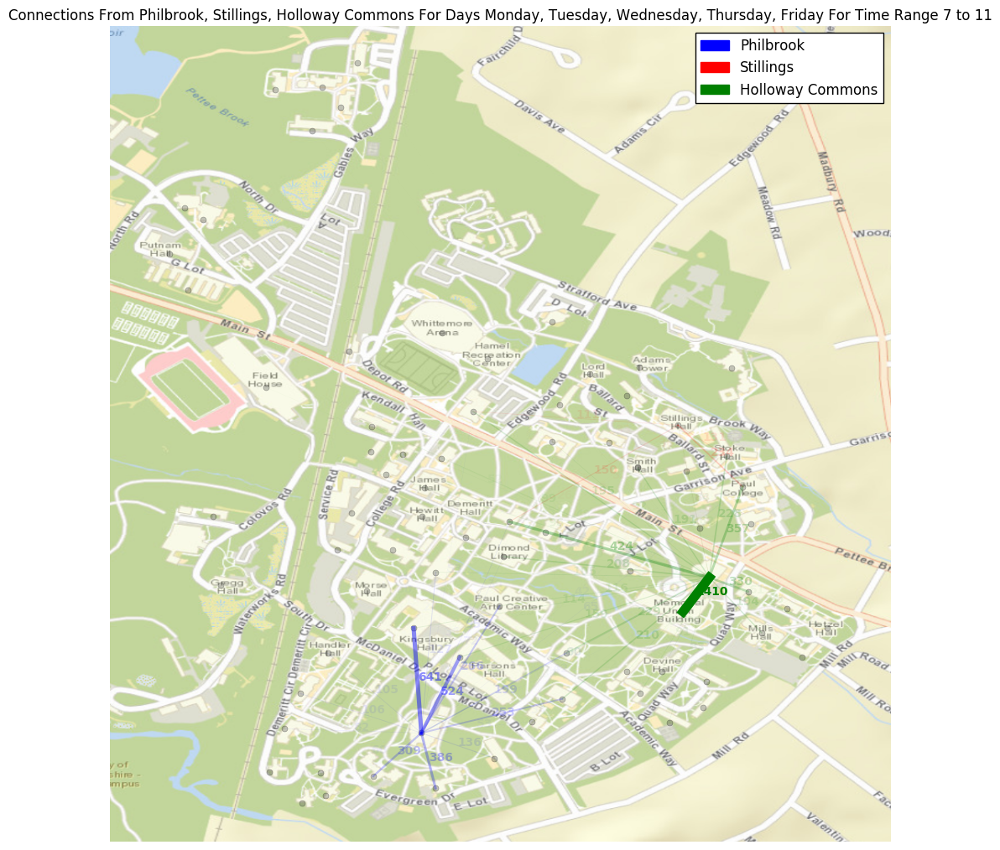

In [46]:
plot_path_lines([0, 1, 2, 3, 4], (7,11), ['Philbrook', 'Stillings', 'Holloway Commons'])

The plot above shows where students who were eating breakfast at either 'Philbrook', 'Stillings', or 'Holloway Commons' connected to next. The thickness and opacity of the lines show the number of students, the thicker the line is, the greater number of students who have travelled that particular path.

From this chart we can see some interesting things. As we might expect the most connections is from Holloway Commons to Memorial Union. This makes sense because the buildings are connected. We can also see that most people eat next to where their next building is. This makes me think that people don't necessarily choose their favorite dining halls in the morning and people would rather opt for convenience. 

I also find it very interesting that buildings in between Philbrook and Holloway Commons have a very similar number of people coming from the two. This could just be due to the fact that these people came from places close to the dining halls already and they saw no reason to travel out of their way to go to a different dining hall even though its an equal distance from their next class. The only way to test this theory would be to look at path iterations so we could see one step before this one.

### 2.4.3 Iterative Building Paths
<a id = '2.4.3'></a>
We weren't really able to get an in-depth understanding of traffic flow around campus with the tools created so far, because we would only follow people for one path at a time. In order for us to follow student's paths from a certain location for multiple iterations we needed to slightly alter the "plot_path_lines" function.

Before we could follow people for multiple trips we first needed to create a function that would return a dictionary with someone's MAC Address as the key, and a list of all the buildings visited originating at a specified building as the value. The function below will return such a list for the "days", "hours", "building" specified.

In [47]:
def get_people_paths(days, hour, building):
    """
    Returns dictionary with MAC Addresses as keys and list of all buildings travelled to after connecting to specified
    building at specified time/day as values
    
    Keyword arguments:
    days -- days of the week (list(int))
    hours -- hours of each day (list(int))
    building -- name of building (str)
    """
    my_paths = wifi_df[(wifi_df.Weekday.isin(days)) & (wifi_df.Hours.isin(hours))]#Subsetting for days/hours
    my_people_paths = my_paths[my_paths.Building == building]#Getting MAC Addresses in subset who connected to 'building'
    my_paths = my_paths[my_paths.MAC_Address.isin(my_people_paths['MAC_Address'].tolist())]#Subsetting DataFrame for above MAC's
    
    people_connections = {mac:0 for mac in my_paths['MAC_Address'].tolist()}#Dictionary with MAC as key, list buildings as value
    
    for mac, build in zip(my_paths['MAC_Address'].tolist(), my_paths['Building'].tolist()):
        if people_connections[mac] != 0:#if not first time seen in loop
            people_connections[mac].append(build)#Append another building to list
        elif building == build: #Makes sure first entry for everyone is at the specified building
            people_connections[mac] = [building]#first entry for 'mac' will always be 'building'
            
    return people_connections

In [48]:
#Uncomment the line below and run this cell to see what the function "get_people_paths" is returning
#get_people_paths([0], [1,2,3], 'Stoke')

#### 2.4.3.1 Unfiltered Iterative Building Paths
<a id = '2.4.3.1'></a>
Now that we have a function that returns multiple paths we can implement a function to iteratively plot the path lines for a group of students originating at a location.

The function below will find all students who connected to 'building' and track their next N paths where N is equal to the value passed to the parameter 'iterations'.

In [49]:
def plot_iterative_path_lines(days, hour_range, building, iterations):
    
    hours = list(range(hour_range[0],hour_range[1]+1)) #Converting tuple range to list of hours
    people_paths = get_people_paths(days, hours, building) #Getting the people's paths at the specified parameters
    
    #Loop for iterations
    for it in range(1, iterations+1):
        
        path_dict = {(b,c):0 for c in list_buildings for b in list_buildings}#Used for plotting lines
        people_building_dict = {building:0 for building in list_buildings}#Used for plotting building circles
        
        #Looping through dictionary 'people_paths' - keys are path (tuple of buildings), values are list of buildings
        for key, value in people_paths.items():
            if len(value)>it:#if list has more buildings than it (current iteration)
                try:
                    if value[it] != value[it-1]:#Makes sure past iteration's building in list is different than current
                        path_dict[(people_paths[key][it-1], people_paths[key][it])]+=1#Add 1 to path
                        people_building_dict[value[it-1]] += 1#Add 1 to building
                except KeyError:
                    pass
   
        total = sum(path_dict.values())
        dot_scale = 40/(max(people_building_dict.values())/total)#Sets biggest dot to size 40
        point_dict = {key:{'value':value, 'size':dot_scale*(value/total), 'color':'Blue'} for key,
                      value in people_building_dict.items() if value!=0}
    
        line_dict = {key:{'value':value, 'lw':50*(value/total), 'alpha':.8,
                                      'color':'Black'} for key, value in path_dict.items()}
        
        m = plot_arcgis_campus()
        plot_points(m, point_dict)
        plot_lines(m, line_dict, labels=False)
        
        plt.title('Originating From: '+str(building) +' Iteration: '+str(it)+' With '+str(total)+' Connections')

This function allows to see where people are going for multiple trips, and can answer many questions such as:
  * Where are Stoke residents going on weekend nights?
  * Where do people who study at the library on Saturday live?
  
  
To demonstrate the function's capacility I will answer the last question with the function and the following parameters:
* __Starting Building__: Dimond Library
* __Days__: [5] (Saturday)
* __Time__: (12,18) 12:00 PM to 6:00 PM
* __Iterations__: 3
<br>

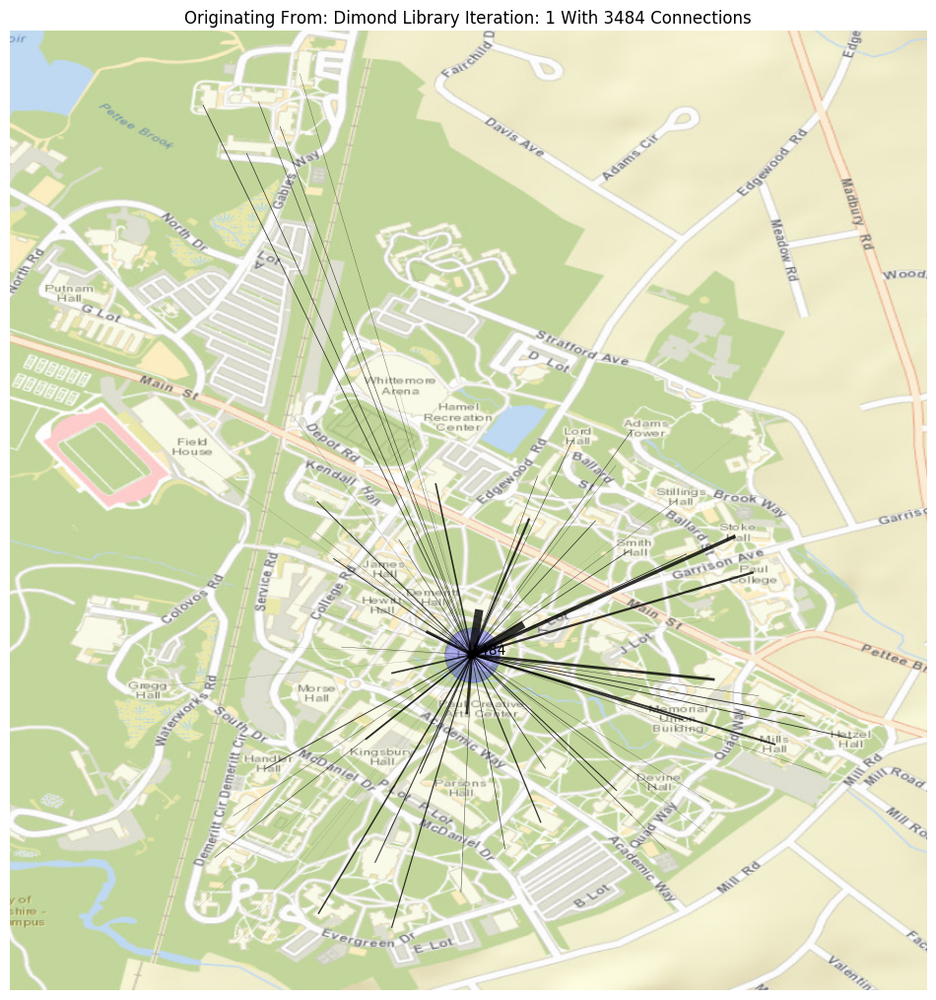

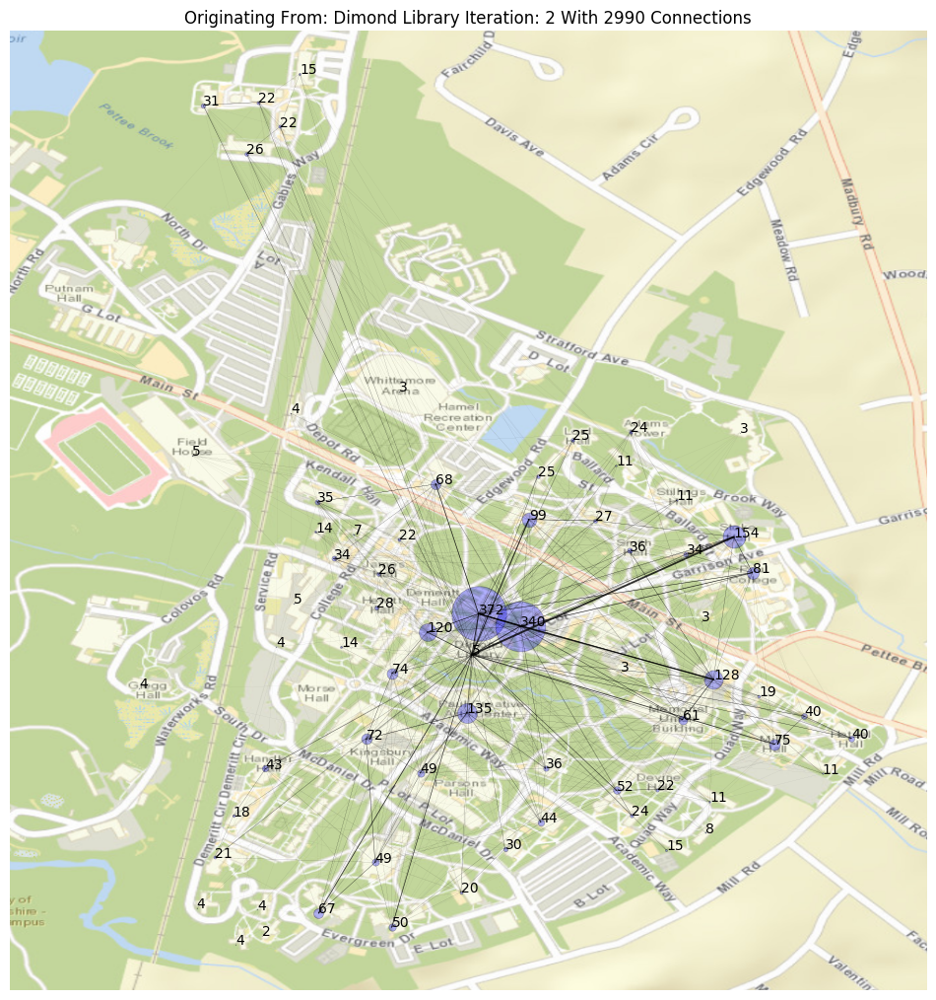

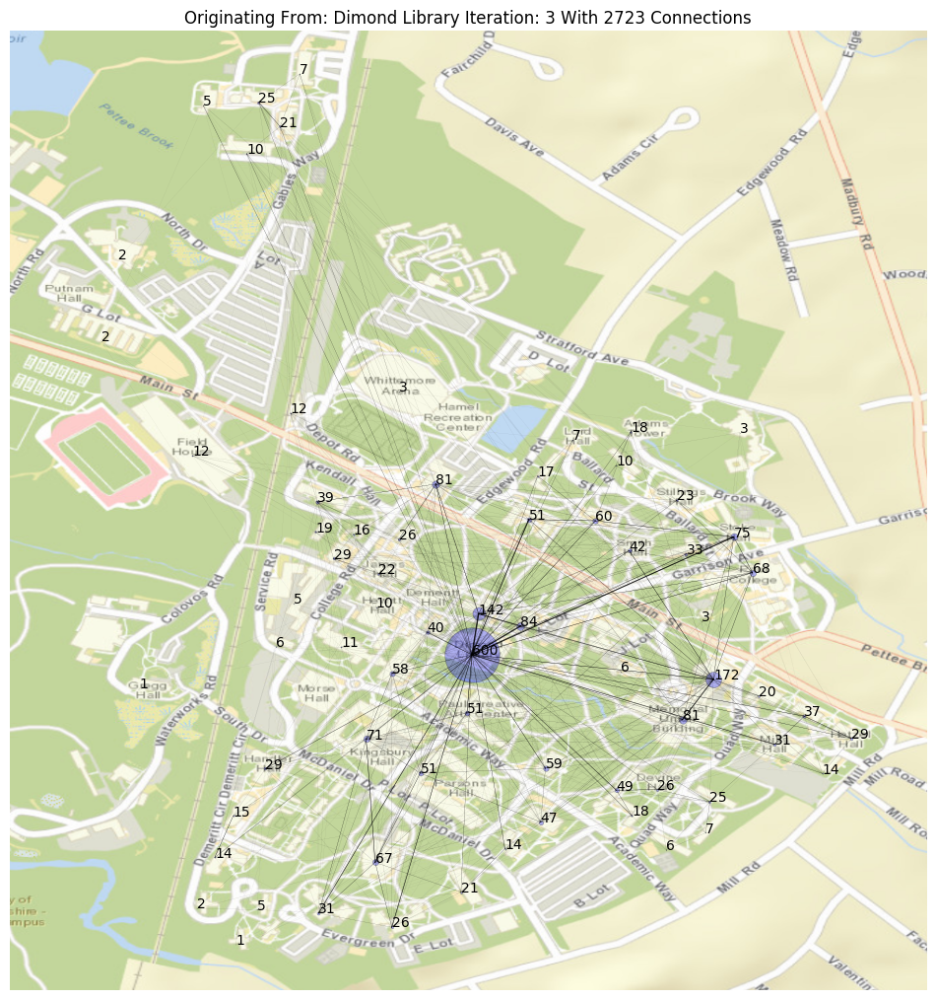

In [50]:
plot_iterative_path_lines([5], (12,18), 'Dimond Library', 3)

The first iteration shows where students travelled from 'Dimond Library', again with the thickness of the line indicating how many students followed that path, and the circle size representing how many people started at that location before travelling one of the paths. In the second iteration we can see that many students are going to Stoke because Stoke has the largest circle for a dormitory. Even on the third iteration Stoke has the highest number of people departing than any other dorm, so it seems that Stoke has many residents who study on Saturdays.

This is a very powerful map as it allows us to visualize how students travel around campus given where they start from, but this map also seems pretty cluttered and is more focused on a macro level.

#### 2.4.3.2 Filtered Iterative Building Paths
<a id = '2.4.3.2'></a>
Due to the chaos-ness of this last visualization we decided to edit the function to accept a few additional arguments that will help narrow the scope of what we're looking at, and color code the lines accordingly. This will help people to draw insight from the plot faster.

The arguments we added were:
  * __start_num:__ This is the number of starting paths you want to follow
  * __max_buildings:__ This is the maximum number of buildings you want to see paths from
  * __path_num:__ This is the number of paths you want graphed after the first iteration
  

In [51]:
def plot_custom_iterative_path_lines(days, hour_range, building, iterations, start_num=5, max_buildings=15, path_num=30):
    
    last_buildings = [building]
    hours = list(range(hour_range[0],hour_range[1]+1)) #Converting tuple range to list of hours
    people_paths = get_people_paths(days, hours, building) #Getting the people's paths at the specified parameters
    
    for it in range(1, iterations+1):

        path_dict = {(b, c):0 for b in last_buildings for c in list_buildings if b!=c}
        people_building_dict = {building:0 for building in list_buildings}

        for key, value in people_paths.items():
            if len(value)>it:
                try:
                    if value[it] != value[it-1]:
                        if value[it-1] in last_buildings:
                            people_building_dict[value[it-1]] += 1
                        path_dict[(people_paths[key][it-1], people_paths[key][it])]+=1
                except KeyError:
                    pass
        
        if it==1:
            top_paths = sorted(path_dict.items(), key=lambda x:x[1], reverse=True)[:int(start_num)]
        else:
            top_paths = sorted(path_dict.items(), key=lambda x:x[1], reverse=True)[:path_num]
        top_buildings = [x[0][1] for x in top_paths]
        
        total = sum([x[1] for x in top_paths])
        building_max = max([x[1] for x in top_paths])
        alpha_scale = 1/building_max
        lw_scale = 5/building_max
        
        dot_total = sum(people_building_dict.values())
        dot_max = max(people_building_dict.values())
        dot_scale = 40/(dot_max/dot_total)#Sets biggest dot to size 40
        
        color_dict = {building:color for building, color in zip(last_buildings, MY_COLORS)}
        point_dict = {key:{'value':value, 'size':dot_scale*(value/dot_total), 'color':color_dict[key]} for key,
                      value in people_building_dict.items() if value!=0}
        line_dict = {key:{'value':value, 'lw':lw_scale*value, 'alpha':alpha_scale*value,
                                              'color':color_dict[key[0]]} for key, value in top_paths if value!=0}
        m = plot_arcgis_campus()
        plot_points(m, point_dict)
        plot_lines(m, line_dict, labels=True)

        plt.legend(handles=[mpatches.Patch(color=color_dict[b], label='Path From '+str(b)) for b in last_buildings])
        last_buildings = list(set([x[0][1] for i, x in enumerate(top_paths) if i<max_buildings]))
        plt.title('Originating From: '+str(building) +' Iteration: '+str(it)+' With '+str(dot_total)+' Connections')

To really demonstrate the difference between this new function and the last one I will show you an example using the same arguments as before:
* __building__: Dimond Library
* __days__: [5] Saturday
* __hour_range__: (12,18) 12:00 PM to 6:00 PM
* __iterations__: 4
* __start_num__: 10
* __max_buildings__: 10
* __path_num__: 50

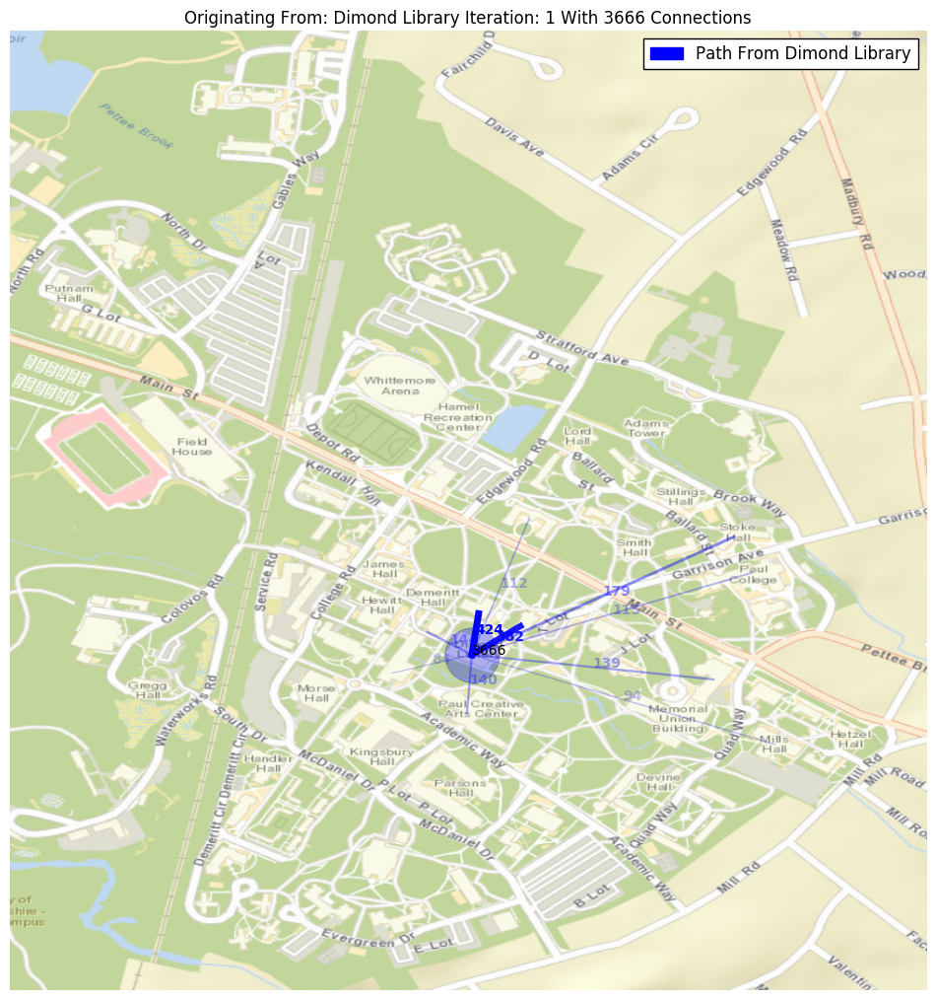

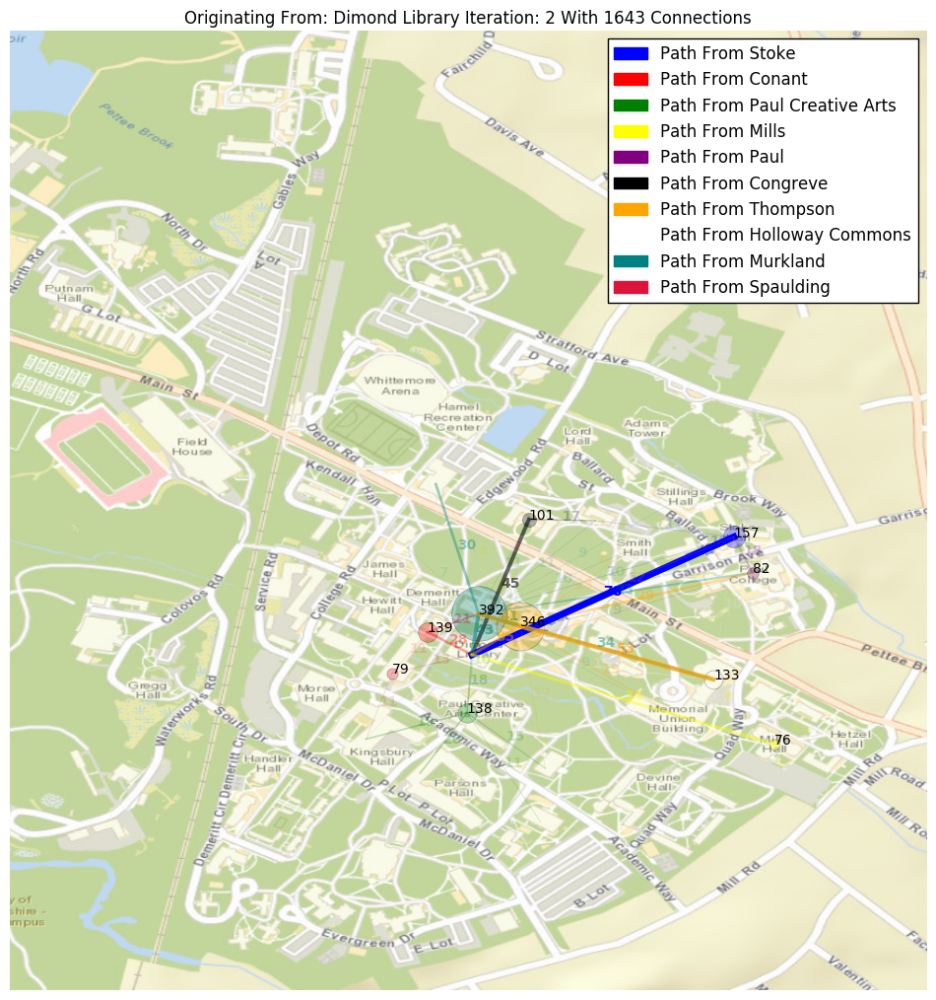

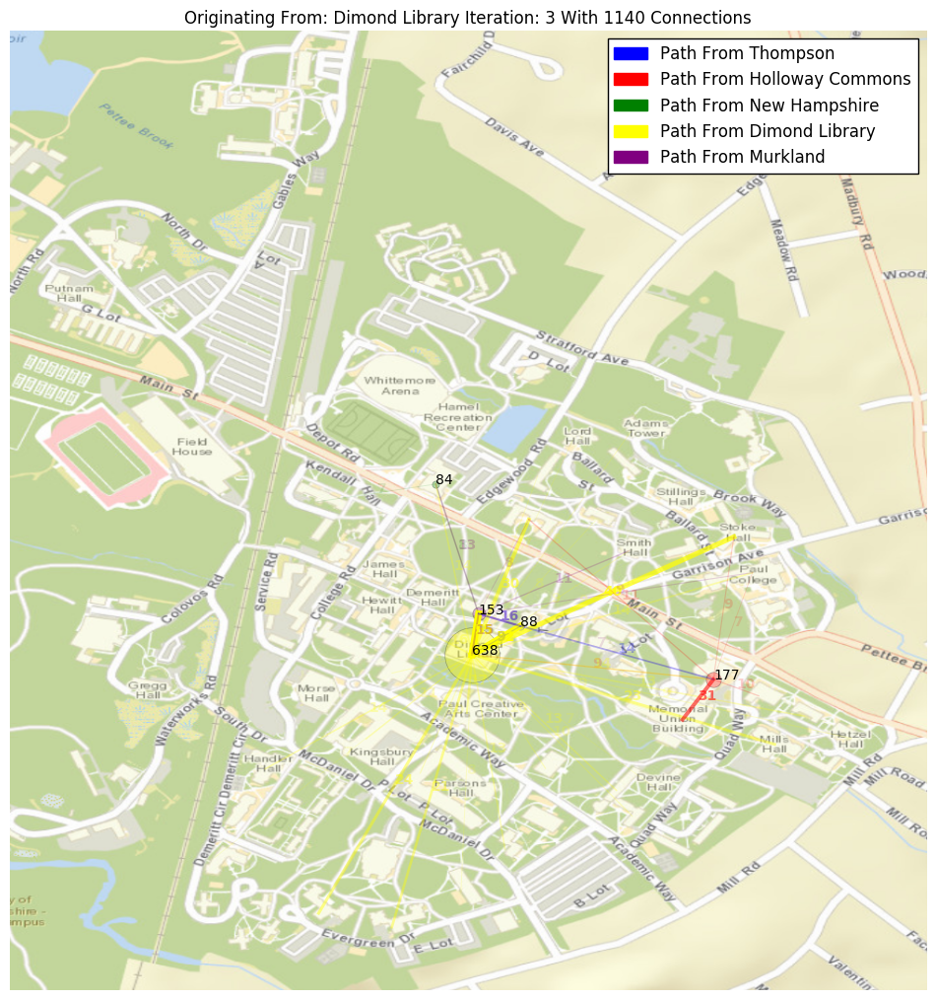

In [52]:
plot_custom_iterative_path_lines([5], (12,18), 'Dimond Library', 3, start_num=10, max_buildings=10, path_num=50)

Through tweaking these additional arguments we are able to easily trace the most common paths from any building and follow where they're going next for additional iterations. Like the other graph before the line width and opacity symbolizes how many people took the path, however this graph has a colored number at the midpoint of every line that represents the exact number of people on that path with the number's color representing the origin of those people on the path. This makes the graph directed, where as the old graph was undirected because you didn't know which way people were going between buildings. 

This function does a great job removing all the noise from the chart, which allows someone to draw insights from it much faster.
In iteration two you are now able to find other dorms much quicker than you could with the function before. It is now noticeable that both Congreve and the Mills have a significant presence at the library on Saturday's as well as Stoke.

The third iteration is where things get really interesting though. The third iteration shows that most people come back to the library after leaving in iteration one. This wasn't evident in the previous graph because of all the noise, but this can be clearly shown here. This phenomenon could be due to people leaving to get stuff at their dorms or taking a break to go eat at the dining hall, it's hard to say why people return in such great numbers.

Another possibility for this phenomenon could be that the access points aren't synchronized on the same time, so when sorting our entries by time they won't be in the proper order. Determining if the access points are synchronized on time is outside of the scope of this project, but it is something worth looking into.

# 3 Interactive Descriptive Plots
<a id = '3'></a>
The plots we have created so far are great for gaining insight but they aren't easily reproducible for everyone. In order for these plots to be accessible to everyone for acquiring insight we decided to make them interactable.

## 3.1 Interactive Top Path Comparison
<a id = '3.1'></a>

The first interactive interface we created is below.

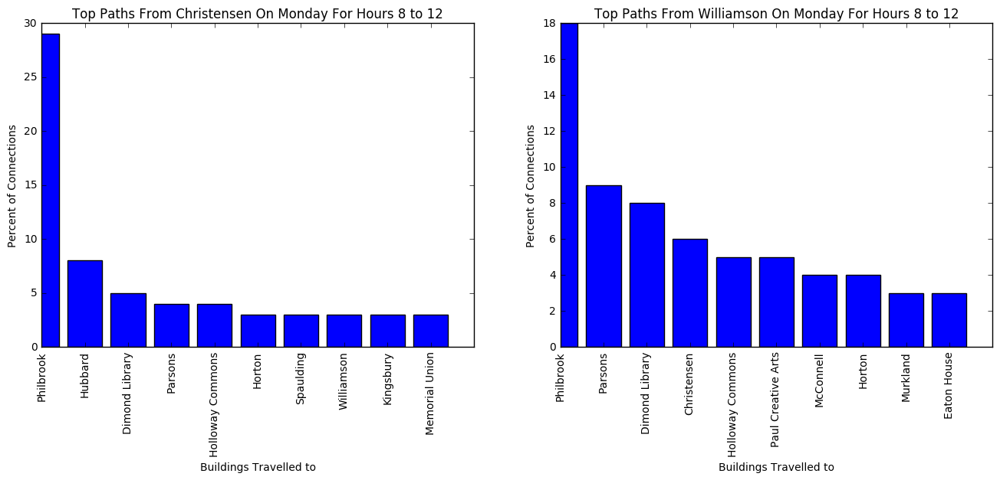

In [53]:
def plot_both_top_paths(b):
    """
    Plots two bar graphs of the top paths by calling plot_top_paths twice for specified ipywidget values.
    """
    
    clear_output(wait=True)
    weekday_list1 = [i for i in range(7) if top_path_hbox2.children[i+1].value==True]
    weekday_list2 = [i for i in range(7) if top_path_hbox6.children[i+1].value==True]
    plt.figure(figsize=(16,12))
    plt.subplot(2, 2, 1)
    plot_top_paths(top_path_building_dropdown1.value, weekday_list1, top_path_time_slider1.value,
                   percent=top_path_percent_checkbox.value)
    plt.subplot(2, 2, 2)
    plot_top_paths(top_path_building_dropdown2.value, weekday_list2, top_path_time_slider2.value,
                   percent=top_path_percent_checkbox.value)
    plt.show()


top_path_building_text1 = widgets.Latex(value='Select Building One:', width='20%')
top_path_building_dropdown1 = widgets.Dropdown(options = list_buildings, height='25px')
top_path_hbox1 = widgets.HBox(children=[top_path_building_text1, top_path_building_dropdown1], width='100%', height='50px')

top_path_weekday_text1 = widgets.Latex(value='Day of Week:', width='10%')
top_path_monday_checkbox1 = widgets.Checkbox(description = 'Monday:   ', value=False, width='10%')
top_path_tuesday_checkbox1 = widgets.Checkbox(description = 'Tuesday:  ', value=False, width='10%')
top_path_wednesday_checkbox1 = widgets.Checkbox(description = 'Wednesday:', value=False, width='10%')
top_path_thursday_checkbox1 = widgets.Checkbox(description = 'Thursday: ', value=False, width='10%')
top_path_friday_checkbox1 = widgets.Checkbox(description = 'Friday:   ', value=False, width='10%')
top_path_saturday_checkbox1 = widgets.Checkbox(description = 'Saturday: ', value=False, width='10%')
top_path_sunday_checkbox1 = widgets.Checkbox(description = 'Sunday:   ', value=False, width='10%')
top_path_hbox2 = widgets.HBox(height='40px',width='100%')
top_path_hbox2.children = [top_path_weekday_text1, top_path_monday_checkbox1, top_path_tuesday_checkbox1, top_path_wednesday_checkbox1,
                        top_path_thursday_checkbox1, top_path_friday_checkbox1, top_path_saturday_checkbox1, top_path_sunday_checkbox1]

top_path_hour_text1 = widgets.Latex(value='Enter Time Range:', width='20%')
top_path_time_slider1 = widgets.IntRangeSlider(min=0,max=23,step=1,value=(0,23), width='80%')
top_path_hbox3 = widgets.HBox(height='40px',width='100%')
top_path_hbox3.children = [top_path_hour_text1, top_path_time_slider1]

top_path_submit = widgets.Button(description='Plot Top Paths!')
top_path_submit.on_click(plot_both_top_paths)
top_path_percent_checkbox = widgets.Checkbox(description='Display in percent: ', value=False, width=40)
top_path_hbox4 = widgets.HBox(height='40px',width='100%')
top_path_hbox4.children = [top_path_submit, top_path_percent_checkbox]

top_path_building_text2 = widgets.Latex(value='Select Building One:', width='20%')
top_path_building_dropdown2 = widgets.Dropdown(options = list_buildings, height='25px')
top_path_hbox5 = widgets.HBox(children=[top_path_building_text2, top_path_building_dropdown2], width='100%', height='50px')

top_path_weekday_text2 = widgets.Latex(value='Day of Week:', width='10%')
top_path_monday_checkbox2 = widgets.Checkbox(description = 'Monday:   ', value=False, width='10%')
top_path_tuesday_checkbox2 = widgets.Checkbox(description = 'Tuesday:  ', value=False, width='10%')
top_path_wednesday_checkbox2 = widgets.Checkbox(description = 'Wednesday:', value=False, width='10%')
top_path_thursday_checkbox2 = widgets.Checkbox(description = 'Thursday: ', value=False, width='10%')
top_path_friday_checkbox2 = widgets.Checkbox(description = 'Friday:   ', value=False, width='10%')
top_path_saturday_checkbox2 = widgets.Checkbox(description = 'Saturday: ', value=False, width='10%')
top_path_sunday_checkbox2 = widgets.Checkbox(description = 'Sunday:   ', value=False, width='10%')
top_path_hbox6 = widgets.HBox(height='40px',width='100%')
top_path_hbox6.children = [top_path_weekday_text2, top_path_monday_checkbox2, top_path_tuesday_checkbox2, top_path_wednesday_checkbox2,
                        top_path_thursday_checkbox2, top_path_friday_checkbox2, top_path_saturday_checkbox2, top_path_sunday_checkbox2]

top_path_hour_text2 = widgets.Latex(value='Enter Time Range:', width='20%')
top_path_time_slider2 = widgets.IntRangeSlider(min=0,max=23,step=1,value=(0,23), width='80%')
top_path_hbox7 = widgets.HBox(height='40px',width='100%')
top_path_hbox7.children = [top_path_hour_text2, top_path_time_slider2]

top_path_submit = widgets.Button(description='Plot Top Paths!')
top_path_submit.on_click(plot_both_top_paths)
top_path_percent_checkbox = widgets.Checkbox(description='Display in percent: ', value=False, width=40)
top_path_hbox4 = widgets.HBox(height='40px',width='100%')
top_path_hbox4.children = [top_path_submit, top_path_percent_checkbox]


top_path_tab1 = widgets.VBox(children=[top_path_hbox1, top_path_hbox2, top_path_hbox3])
top_path_tab2 = widgets.VBox(children=[top_path_hbox5, top_path_hbox6, top_path_hbox7])

top_path_tab = widgets.Tab(children=[top_path_tab1, top_path_tab2])
top_path_tab.set_title(0, 'Plot1')
top_path_tab.set_title(1, 'Plot2')
display(top_path_tab)

display(top_path_hbox4)

From this interactive interface one is able to quickly compare where most people are going from two buildings at a specified day and time.

On the plot 1 tab, select the building you're interested in from the dropdown. Click the small boxes next to the day's of the week you're interested in, and then drag the time slider to reflect a time range you want to look at. Repeat these steps for plot 2 on the plot 2 tab and select at the button checkbox if you want the results in percentages or a raw count.

The following example below is comparing Philbrook and Stilings on Monday and Wednesday between the hours of 7 and 10. From this chart we are not only able to see that Philbrook has more morning traffic on these days, but we're also able to see that most people's next stop is close to the dining hall they're eating at.

## 3.2 Interactive Hourly Connection Scatterplot
<a id = '3.2'></a>
For the next interactive interface we wanted to be able to compare hourly connections for up to three different buildings on various days. The interactive interface below uses the "plot_connections" function defined earlier to accomplish this.

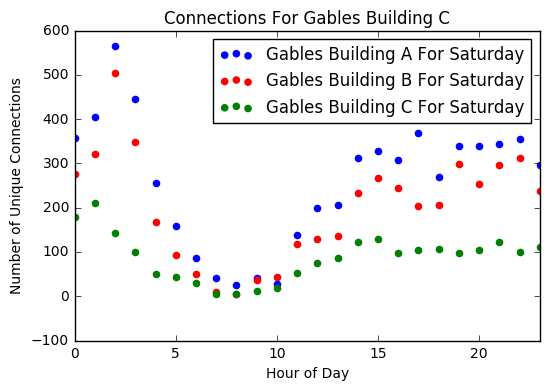

In [54]:
def plot_connection_scatter(b):
    
    clear_output(wait=True)
    connection_scatter_plots, connection_scatter_labels = [], []
    if connection_scatter_plot1_check.value==True:
        connection_scatter_my_plot1 = plot_connections(connection_scatter_building_dropdown1.value, 
                                                connection_scatter_day_slider1.value, connection_scatter_color_dropdown1.value)
        connection_scatter_plots.append(connection_scatter_my_plot1)
        connection_scatter_label1 = str(connection_scatter_building_dropdown1.value)+ ' For '\
        + WEEKDAY_DICT[connection_scatter_day_slider1.value]
        connection_scatter_labels.append(connection_scatter_label1)
        
    if connection_scatter_plot2_check.value==True:
        connection_scatter_my_plot2 = plot_connections(connection_scatter_building_dropdown2.value, 
                                                connection_scatter_day_slider2.value, connection_scatter_color_dropdown2.value)
        connection_scatter_plots.append(connection_scatter_my_plot2)
        connection_scatter_label2 = str(connection_scatter_building_dropdown2.value)+ ' For ' \
        + WEEKDAY_DICT[connection_scatter_day_slider2.value]
        connection_scatter_labels.append(connection_scatter_label2)
        
    if connection_scatter_plot3_check.value==True:
        connection_scatter_my_plot3 = plot_connections(connection_scatter_building_dropdown3.value, 
                                                connection_scatter_day_slider3.value, connection_scatter_color_dropdown3.value)
        connection_scatter_plots.append(connection_scatter_my_plot3)
        connection_scatter_label3 = str(connection_scatter_building_dropdown3.value)+ ' For ' \
        + WEEKDAY_DICT[connection_scatter_day_slider3.value]
        connection_scatter_labels.append(connection_scatter_label3)
    
    plt.legend(connection_scatter_plots, connection_scatter_labels)

connection_scatter_text1 = widgets.Latex(value='Select Building:', width='10%')
connection_scatter_building_dropdown1 = widgets.Dropdown(options = list_buildings, height='25px')
connection_scatter_hbox1 = widgets.HBox(children=[connection_scatter_text1, connection_scatter_building_dropdown1],
                                        width='100%', height='50px')

connection_scatter_text2 = widgets.Latex(value='Select Building:', width='10%')
connection_scatter_building_dropdown2 = widgets.Dropdown(options = list_buildings, height='25px')
connection_scatter_hbox2 = widgets.HBox(children=[connection_scatter_text2, connection_scatter_building_dropdown2],
                                        width='100%', height='50px')

connection_scatter_text3 = widgets.Latex(value='Select Building:', width='10%')
connection_scatter_building_dropdown3 = widgets.Dropdown(options = list_buildings, height='25px')
connection_scatter_hbox3 = widgets.HBox(children=[connection_scatter_text3, connection_scatter_building_dropdown3],
                                        width='100%', height='50px')
#--------------------------------------------------------------------------------------
connection_scatter_text4 = widgets.Latex(value='Select Day:', width='10%')
connection_scatter_day_slider1 = widgets.IntSlider(min=0, max=6, step=1)
connection_scatter_hbox4 = widgets.HBox(children=[connection_scatter_text4, connection_scatter_day_slider1],
                                        width='100%', height='50px')

connection_scatter_text5 = widgets.Latex(value='Select Day:', width='10%')
connection_scatter_day_slider2 = widgets.IntSlider(min=0, max=6, step=1)
connection_scatter_hbox5 = widgets.HBox(children=[connection_scatter_text5, connection_scatter_day_slider2],
                                        width='100%', height='50px')

connection_scatter_text6 = widgets.Latex(value='Select Day:', width='10%')
connection_scatter_day_slider3 = widgets.IntSlider(min=0, max=6, step=1)
connection_scatter_hbox6 = widgets.HBox(children=[connection_scatter_text6, connection_scatter_day_slider3],
                                        width='100%', height='50px')
#--------------------------------------------------------------------------------------
connection_scatter_text7 = widgets.Latex(value='Select Color:', width='10%')
connection_scatter_color_dropdown1 = widgets.Dropdown(options = MY_COLORS, height='25px')
connection_scatter_hbox7 = widgets.HBox(children=[connection_scatter_text7, connection_scatter_color_dropdown1],
                                        width='100%', height='50px')

connection_scatter_text8 = widgets.Latex(value='Select Color:', width='10%')
connection_scatter_color_dropdown2 = widgets.Dropdown(options = MY_COLORS, height='25px')
connection_scatter_hbox8 = widgets.HBox(children=[connection_scatter_text8, connection_scatter_color_dropdown2],
                                        width='100%', height='50px')

connection_scatter_text9 = widgets.Latex(value='Select Color:', width='10%')
connection_scatter_color_dropdown3 = widgets.Dropdown(options = MY_COLORS, height='25px')
connection_scatter_hbox9 = widgets.HBox(children=[connection_scatter_text9, connection_scatter_color_dropdown3],
                                        width='100%', height='50px')


connection_scatter_tab1 = widgets.VBox(children=[connection_scatter_hbox1, connection_scatter_hbox4, connection_scatter_hbox7])
connection_scatter_tab2 = widgets.VBox(children=[connection_scatter_hbox2, connection_scatter_hbox5, connection_scatter_hbox8])
connection_scatter_tab3 = widgets.VBox(children=[connection_scatter_hbox3, connection_scatter_hbox6, connection_scatter_hbox9])

connection_scatter_tab = widgets.Tab(children=[connection_scatter_tab1, connection_scatter_tab2, connection_scatter_tab3])
connection_scatter_tab.set_title(0, 'Plot1')
connection_scatter_tab.set_title(1, 'Plot2')
connection_scatter_tab.set_title(2, 'Plot3')
display(connection_scatter_tab)

connection_scatter_button = widgets.Button(description='Display Plots!', width='10%', padding=10)
connection_scatter_button.on_click(plot_connection_scatter)

connection_scatter_plot1_check = widgets.Checkbox(description = 'Include Plot1', value=False, width=40)
connection_scatter_plot2_check = widgets.Checkbox(description = 'Include Plot2', value=False, width=40)
connection_scatter_plot3_check = widgets.Checkbox(description = 'Include Plot3', value=False, width=40)

connection_scatter_hbox10 = widgets.HBox(children=[connection_scatter_button, connection_scatter_plot1_check, 
                                                   connection_scatter_plot2_check, connection_scatter_plot3_check],
                                         width='100%', height='50px')
display(connection_scatter_hbox10)

On each plot tab just select the values you want to plot. Select the building from the dropdown bar, the day of the week from the slider, and the color from the dropdown bar at the bottom. Then select which plots you want to include and hit the "Display Plots!" button.

The example below is the hourly connections for Gables A, Gables B, and Gables C for saturday. As you can see from this chart the number of connections for Gables C is significantly lower than Gables A, and Gables B, especially at peak party hours of 12:00 AM to 2:00 AM showing that it might be more beneficial for RA's to focus more on those two towers. 

There are many applications to these charts because they essentially show student activity in any building.

## 3.3 Interactive Geographic Plotting
<a id = '3.3'></a>
Below is the code to produce the last interactive interface. From this interactive interface one is able to attain a great deal of information about the UNH campus through utilizing the geographic plot functions we created earlier.

This interface consists of three tabs that each provide a different function. 

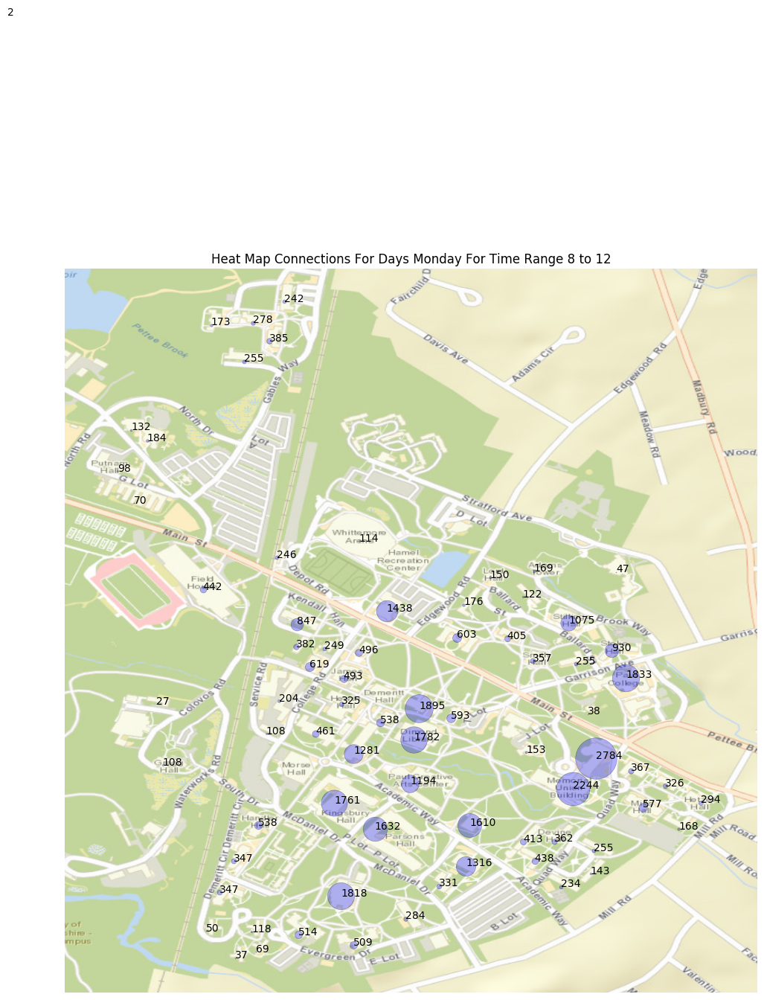

In [55]:
def plot_path_map(b):
    
    clear_output(wait=True)
    btext_list = (text.value).split(', ')
    weekday_list = [i for i in range(7) if hbox2.children[i+1].value==True]
    time_range = start_time_slider.value
    plot_path_lines(weekday_list, time_range, btext_list)
    
def plot_heat_map(b):
    
    clear_output(wait=True)
    btext_list = (text.value).split(', ')
    weekday_list = [i for i in range(7) if hbox2.children[i+1].value==True]
    time_range = start_time_slider.value
    campus_heatmap(weekday_list, time_range)
    
def plot_iter_paths(b):
    
    clear_output(wait=True)
    weekday_list = [i for i in range(7) if hbox2.children[i+1].value==True]
    time_range = start_time_slider.value
    building = dropdown_iter_building.value
    iterations = int(dropdown_iter_number.value)
    if dropdown_iter_building_number.value == 'all':
        plot_iterative_path_lines(weekday_list, time_range, building, iterations)
    else:
        start_num = dropdown_iter_building_number.value
        path_num = int(iter_text.value)
        max_buildings = max_buildings=int(dropdown_iter_max_buildings.value)
        plot_custom_iterative_path_lines(weekday_list, time_range, building, iterations, start_num, max_buildings, path_num)

text_label = widgets.Latex(value='Enter Buildings to plot:', width='20%')
text = widgets.Text(description='', width='70%')
hbox1 = widgets.HBox(height='40px',width='100%')
hbox1.children = [text_label, text]

text_label2 = widgets.Latex(value='Day of Week:', width='10%')
monday_checkbox = widgets.Checkbox(description = 'Monday:   ', value=False, width='10%')
tuesday_checkbox = widgets.Checkbox(description = 'Tuesday:  ', value=False, width='10%')
wednesday_checkbox = widgets.Checkbox(description = 'Wednesday:', value=False, width='10%')
thursday_checkbox = widgets.Checkbox(description = 'Thursday: ', value=False, width='10%')
friday_checkbox = widgets.Checkbox(description = 'Friday:   ', value=False, width='10%')
saturday_checkbox = widgets.Checkbox(description = 'Saturday: ', value=False, width='10%')
sunday_checkbox = widgets.Checkbox(description = 'Sunday:   ', value=False, width='10%')
hbox2 = widgets.HBox(height='40px',width='100%')
hbox2.children = [text_label2, monday_checkbox, tuesday_checkbox, wednesday_checkbox, thursday_checkbox, 
                  friday_checkbox, saturday_checkbox, sunday_checkbox]

text_label3 = widgets.Latex(value='Enter Time Range:', width='10%')
start_time_slider = widgets.IntRangeSlider(min=0,max=23,step=1,value=(0,23), width='80%')
hbox3 = widgets.HBox(height='40px',width='100%')
hbox3.children = [text_label3, start_time_slider]

path_plot_button = widgets.Button(description='Plot Paths!', width='10%')
submit_path_hbox = widgets.HBox(height='40px',width='100%')
submit_path_hbox.children = [path_plot_button]
path_plot_button.on_click(plot_path_map)

heat_button = widgets.Button(description='Plot Heat Map!')
submit_heat_hbox = widgets.HBox(height='40px',width='100%')
submit_heat_hbox.children = [heat_button]
heat_button.on_click(plot_heat_map)

building_range = '5 6 7 8 9 10 11 12 13 14 15 all'.split()
iter_building_latex = widgets.Latex(value='Select Building:', width='10%')
iter_number_latex = widgets.Latex(value='Select # Iterations:', width='15%')
iter_building_number = widgets.Latex(value='Select # Start Paths:', width='10%')
dropdown_iter_building_number = widgets.Dropdown(options=building_range, width='15%')
dropdown_iter_building = widgets.Dropdown(options=list_buildings, width='15%')
dropdown_iter_number = widgets.Dropdown(options=['2', '3', '4'])
iter_hbox = widgets.HBox(height='40px',width='100%')
iter_hbox.children = [iter_building_latex, dropdown_iter_building, iter_number_latex, dropdown_iter_number,
                      iter_building_number, dropdown_iter_building_number]

iter_build_num_latex = widgets.Latex(value='Select Max # Buildings:', width='15%')
iter_path_num = widgets.Latex(value='Enter # Paths:', width='10%')
dropdown_iter_max_buildings = widgets.Dropdown(options=building_range)
iter_text = widgets.Text(description='', width='20%')

iter_button = widgets.Button(description='Plot Iterative Paths!')
submit_iter_hbox = widgets.HBox(height='40px',width='100%')
submit_iter_hbox.children = [iter_build_num_latex, dropdown_iter_max_buildings, iter_path_num, iter_text, iter_button]
iter_button.on_click(plot_iter_paths)

path_tab = widgets.VBox(children=[hbox1, hbox2, hbox3, submit_path_hbox])
heat_tab = widgets.VBox(children=[hbox2, hbox3, submit_heat_hbox])
iterative_tab = widgets.VBox(children=[iter_hbox, hbox2, hbox3, submit_iter_hbox])

tab = widgets.Tab(children=[path_tab, heat_tab, iterative_tab])
tab.set_title(0, 'Path Plot')
tab.set_title(1, 'Heat Map')
tab.set_title(2, 'Iterative Path Plot')
display(tab)

### 3.3.1 Path Plot Tab
<a id = '3.3.1'></a>
The first tab is the Path Plot tab. On this tab you type in the buildings you're interested in seperated by a comma and a space, the days of the week you're interested in, and select a time range with the slider. After you do that you hit the "Plot Paths!" button and a plot showing where people are going from your buildings is generated. From this plot one can visualize where people on campus are going at a certain date and time.

### 3.3.2 Heat Map Tab
<a id = '3.3.2'></a>
The second tab is the Heat Map tab. On this tab you just select the days of the week and a time range you're interested in, and then hit the "Plot Heat Map!" button. A heat map for the number of connections in every building is then generated. From this plot one could see what buildings have the most traffic at a certain time and date.

### 3.3.3 Iterative Path Plot Tab
<a id = '3.3.3'></a>
The last tab is the Iterative Path Plot tab. On this tab there are many options to select from. On the first row of options there are three dropdown boxes. The first dropdown box is the building you're interested in, the second dropdown box is the number of iterations you want, and the third dropdown box is for the number of starting paths you're interested in, this is used to make sure not too many people are being tracked in future iterations, but if you still want every path tracked there is a dropdown option 'all' at the bottom. The next two rows is for selecting the day's of the week and the time range you're interested in. The last row of options contains a dropdown box for the maximum number of buildings you're interested in seeing, a text box where you enter how many paths you want to see after the first iteration, and a button "Plot Iterative Paths" that generates the multiple paths. This function takes awhile to run because it displays a seperate plot for each iteration, also note that if 'all' is selected from the dropdown menu the max number of buildings and number of path options in the last row are ignored. From this plot you are able to track people's movements for multiple iterations.

# 4 Results
<a id = '4'></a>
Our results clearly showed that tools can be developed for a University to leverage wiFi data into insights. We believe this data can be useful for university administrators, the public safety office and the university information technology department. This research and initial look into the student movement patterns will create a platform for which these stakeholders can possibly find answers to questions about the student body, or possibly find new quations to ask that they wouldn't have been able to answer prior to having this resource. 

# 5 Discussion / Conclusion
<a id = '5'></a>
Through the process of performing this research, we were successful in proving that the data the University is already collecting on its students is incredibly valuable for a smart campus type application.We set out to try and prove that we may be able to use this data rather than investing in extremely expensive technologies to perform the same task. 
<br><br>
However, while we were succesful in provinng the usefulness of this data, our findings do have some limitations. For starters, it would be best if we could have access to a live stream of data, however, we are still waiting to hear back from the IT department to know if it is possible or if the access points only transmit the connection data at a set interval. Having access to a live strem would be very valuable for applications such as response to public safety concerns such as disasters of events such as school shootings. Being able to live heatmap the campus may give these first responders or public safety officers a better idea of what the situation is.
<br><br>
Additionally, working with devices other than strictly Apple devices is a clear next step. However, working to filter stationary devices while capturing devices which travel with students would be necessary. For an intial proof of concept, strictly working with apple is functional, however, being able to gain the extra insight provided by as much of the student body as possible would be helpful.
<br><br>
Lastly, a major limitation we had was that we did not have disconnect times in the data. This makes it impossible to know for sure if a student has left a building. This is an unfortunate limitation, however, through filtering data it is fairly easy to presume which students have left campus, assuming students aren't spending more than 9 hours in a classroom.

The next steps to this project are to create some very succinct dashboards which are specific to a desired use-case. We plan to work with departments at the university to create dashboards which can be helpful to thier needs and help usher the University of New Hampshire closer to being a smart campus. 